In [96]:
__author__ = 'Sebastian F. Sanchez and LVM team'
__version__ = '20260414'
__datasets__ = ['SDSS-V LVM DAP (DRPVER=1.2.0, DAPVER = 1.2.0.251218, MJD=60191, EXPNUM=4297)']  
__keywords__ = ['Helix nebula']

# SDSS-V LVM DR20 Helix Nebula (NGC7293) DAP tutorial 

**Purpose.** This notebook documents the process of generating the plots included on Sánchez et al. 2025 (https://ui.adsabs.harvard.edu/abs/2026RMxAA..62...87S/) the Helix Nebula (NGC7293) that used the output of the LVM DAP (https://github.com/sdss/lvmdap), i.e., the DAP-file, as a basic tutorial on how to handle this kind dataproducts.

It teaches how to:
1. open and inspect a DR20 DAP product,
2. generate RGB maps and individual line maps,
3. separate parametric and non-parametric products,
4. build integrated line catalogs,
5. explore kinematics and radial structure,
6. inspect stellar-continuum products and RSP PDFs,
7. and compare different DAP measurement modes.

Although we focus here on the Helix Nebula exposure included in the SDSS5 DR20, the workflow is broadly applicable to any DR20 LVM DAP file. 

# Importing some routines that are needed for the plotting and analysis



In [97]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.table import vstack as tab_vstack
from lvmdap.dap_tools import list_columns,read_DAP_file,map_plot_DAP,scatter
from matplotlib import use as mpl_use
%matplotlib inline
from matplotlib import rcParams as rc
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mpl_colors
from astropy.io import fits

# Import the sdss_access package to get the data
from sdss_access import Access
access = Access(release='dr20', verbose=True)

# Tools for downloading the RSP templates
from pathlib import Path
import gdown


## 1. Load the DR20 DAP file

This cell defines the local directories, identifies the DR20 DAP product to use, and reads it into a table.  
The chosen example is the Helix Nebula exposure, which is particularly useful because it contains strong nebular lines, faint auroral lines, and a wide variety of DAP products in a single field.

From here on, `tab_DAP` is the main table used throughout the notebook.

In here we have to options: (1.1) getting the data using the SDSS acccess procedure, or  (1.2) read it from a local directory. Select the option that is more suitable to you


In [8]:
#####################################################
# (1.0) We define some basic working directories
#####################################################
drpver = "1.2.0"
dapver = '1.2.0.251218' 
DIR_CACHE = 'cache/'
DRVER = 'DR20'
DIR_DAP = 'dap_v1.2.0/'
DIR_FIG = 'figs/'
rsp = 'rsp108'
sn = 'sn20'
expnum = '00004297'
tileid = '11111'
mjd = 60191
i_expnum = int(expnum)

In [ ]:
#
# Get the data using the sdss_access pachage
#
try:
    access.remote()
    kind = 'dap'
    access.add('lvm_dap', drpver = drpver, dapver = dapver, kind = kind, tileid = tileid, mjd = mjd, expnum = i_expnum)
    access.set_stream()
    access.commit()
    # PATH to lvmDAP file
    path_to_data_file = access.full('lvm_dap', drpver = drpver, dapver = dapver, kind = kind, tileid = tileid, mjd = mjd, expnum = i_expnum)
    # Open data file and print a summary of the Header Data Units
    tab_DAP=read_DAP_file(path_to_data_file,verbose=True)
except:
    print("Error accessing the data. Please check the parameters and try again.")

authentication for netloc=data.sdss5.org set for username=sdss5
Error accessing the data. Please check the parameters and try again.


In [23]:
################################################################
# (1.2) Get the data from a local directory
################################################################

DIR_CACHE = 'cache/'
DRVER = 'DR20'
DIR_DAP = 'dap_v1.2.0/'
rsp = 'rsp108'
sn = 'sn20'
expnum = '00004297'
dap_file=f'dap-{rsp}-{sn}-{expnum}.dap.fits.gz'
dap_file=f'{DIR_DAP}/{dap_file}'

#
# This is the standard way to read the DAP file using the lvmdap tools
#
tab_DAP=read_DAP_file(dap_file,verbose=True)

#
# This method store all the inforamtion included in the DAP file in a single astropy table, which is easier to manipulate and explore. We can also read the DAP file using the astropy.io.fits package, but in this case we will have to deal with the different Header Data Units (HDUs) included in the DAP file, which is more complicated.
#



---- ALL Table Columns -----
-------------------------------
|        PT                   |
-------------------------------
id        dec       fiberid   
ra        mask      exposure  
----------------------------------
|        RSP                      |
----------------------------------
id             alpha          flux_st        Fe_MW          
MIN_CHISQ      e_alpha        redshift_st    e_Fe_MW        
Teff           Av_st          med_flux_st    alpha_MW       
e_Teff         e_Av_st        e_med_flux_st  e_alpha_MW     
Log_g          z_st           Teff_MW        vel_st         
e_Log_g        e_z_st         e_Teff_MW      log_ML         
Fe             disp_st        Log_g_MW       log_Mass       
e_Fe           e_disp_st      e_Log_g_MW                    
----------------------------------
|        PE_ord                   |
----------------------------------
id                 vel_pe_4340.49     e_disp_pe_6300.3   disp_pe_6716.44    
flux_pe_3726.03    e_vel_pe_4340.49 

## Explanation of the content of the DAP file

The LVM DAP file is a multi-extension FITS product that contains the results of the spectroscopic analysis performed on each individual fiber. The analysis separates the observed spectrum into stellar and nebular components and derives physical properties for both.

Each row corresponds to a single fiber, identified by a unique `id` (typically `EXPNUM.FIBERID`), allowing the combination of information across extensions.

The main extensions include:
- **PT**: sky position of each fiber (RA, Dec), used to reconstruct spatial maps,
- **RSP / COEFFS**: stellar population properties and decomposition coefficients,
- **PM_ELINES / NP_ELINES**: parametric (Gaussian) and non-parametric measurements of emission lines,
- **ELINES_SIGMA_CHI / ELINES_CHI2_AVG**: line-widths corrected for instrumental resolution and goodness-of-fit diagnostics,
- **INFO**: configuration parameters used in the DAP analysis.

Fluxes are given in units of \(10^{-16}\,\mathrm{erg\,s^{-1}\,cm^{-2}}\) per fiber area, and emission lines are provided both for strong-line parametric fits and for a larger set of transitions using a non-parametric approach.

This structure allows one to:
- reconstruct spatially resolved maps,
- analyze ionized gas properties through emission lines,
- and explore stellar population properties where the continuum is detected.

The following tools provide convenient access to these data products.

In [24]:
# Alternatively, we can read the DAP file using the astropy.io.fits package
try:
    fits.info(path_to_data_file)
except:
    hdu = fits.open(dap_file)
    hdu.info()
    

Filename: dap_v1.2.0//dap-rsp108-sn20-00004297.dap.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     931   ()      
  1  PT            1 BinTableHDU     21   1754R x 6C   [9A, D, D, L, K, K]   
  2  RSP           1 BinTableHDU    101   1754R x 31C   [9A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D]   
  3  COEFFS        1 BinTableHDU     35   189432R x 13C   [9A, K, K, D, D, D, D, D, D, D, D, D, D]   
  4  PM_ELINES     1 BinTableHDU     29   26310R x 10C   [9A, K, 10A, D, D, D, D, D, D, D]   
  5  NP_ELINES_B    1 BinTableHDU   1835   1754R x 913C   [9A, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D

## A. Quick-look spatial visualization with RGB maps

## 2. Define a helper to build RGB emission-line maps

This function converts three selected DAP columns into an RGB representation on the sky.  
It is especially useful for quick visual exploration because it combines three physically different tracers into a single image.

For nebular data, these composite maps are often the fastest way to identify ionization stratification:
- a high-ionization line can be mapped to one color,
- Hα or another recombination line to another,
- and a low-ionization line to a third one.

In the Helix paper, this kind of comparison is central to showing how the compact high-ionization core, the bright [O III] ring, and the low-ionization outer structures are spatially separated.

In [25]:
def map_plot_DAP_rgb(tab_DAP,\
                     rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                     rgb_scale=(1.0,1.0,1.0),\
                 vmin=0, vmax=0, titles=('r','g','b'), filename='junk',\
                fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,fs=18):

    rc.update({'font.size': fs*fsize/5,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : fs*fsize/5,\
               'ytick.labelsize' : fs*fsize/5,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X= tab_DAP['ra'].value
    Y= tab_DAP['dec'].value
    R=tab_DAP[rgb_key[2]].value  
    G=tab_DAP[rgb_key[1]].value    
    B=tab_DAP[rgb_key[0]].value 
    R = R * rgb_scale[0]
    G = G * rgb_scale[1]
    B = B * rgb_scale[2]
    RGB = np.stack((R, G, B), axis=1)
    if (vmin==vmax):
        vmin=np.nanmin(RGB)
        vmax=np.nanmax(RGB)
    print(f'min/max:{vmin}/{vmax}')
    r = (R-vmin)/(vmax-vmin)
    g = (G-vmin)/(vmax-vmin)
    b = (B-vmin)/(vmax-vmin)

    r[r>1]=1
    r[r<0]=0
    b[b>1]=1
    b[b<0]=0
    r[r>1]=1
    r[r<0]=0    
    
    r = np.ma.filled(r, fill_value=0.0)
    g = np.ma.filled(g, fill_value=0.0)
    b = np.ma.filled(b, fill_value=0.0)

    r=r**gamma
    g=g**gamma
    b=b**gamma
    
#    print (r)
    r = np.ma.compressed(r)
    g = np.ma.compressed(g)
    b = np.ma.compressed(b)   


    #print(r,g,b)
    colors = np.stack((r, g, b), axis=1)
    colors[colors>1]=1
    colors[colors<0]=0
#    print(colors)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize*0.95))
#    norm=mpl_colors.PowerNorm(vmin=0,vmax=1,gamma=gamma)
    scatter(X, Y, ax, color=colors, size=sf*35.6/3600)#, color=colors)
    ax.set_xlabel('Ra [deg]')#,fontsize=21)
    ax.set_ylabel('Dec [deg]')#,fontsize=21)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.06*(yy[1]-yy[0]),titles[0],fontsize=fs*(fsize/5),color='tomato')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.12*(yy[1]-yy[0]),titles[1],fontsize=fs*(fsize/5),color='forestgreen')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.18*(yy[1]-yy[0]),titles[2],fontsize=fs*(fsize/5),color='steelblue')

    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}', facecolor='white')
    plt.close()
    return colors

def search_col(tab,key):
    a_keys=[]
    for keys in tab.columns:
        if (keys.find(key)>-1):
            print(keys)
            a_keys.append(keys)
    return a_keys

This is a quick check of the available columns matching `[OII]`.  
It is useful before selecting line names for the maps, because DAP products often contain several measurements of the same transition, depending on whether the analysis is parametric, non-parametric, or from different iterations.

In [26]:
# We can search for the columns in the DAP table using the search_col function
# In this particular case we search for the [OII] emission line, which is a doublet at 3727.09 and 3729.88 Angstroms
oii_cols = search_col(tab_DAP,'[OII]')
# You could experiment with other entries in the DAP table.
# Columns involving Halpha
Ha_cols = search_col(tab_DAP,'_6562')
# Columns involving stellar analysis
st_cols = search_col(tab_DAP,'_st')


flux_[OII]_3726.03
flux_[OII]_3728.82
vel_[OII]_3726.03
vel_[OII]_3728.82
disp_[OII]_3726.03
disp_[OII]_3728.82
EW_[OII]_3726.03
EW_[OII]_3728.82
e_flux_[OII]_3726.03
e_flux_[OII]_3728.82
e_vel_[OII]_3726.03
e_vel_[OII]_3728.82
e_disp_[OII]_3726.03
e_disp_[OII]_3728.82
e_EW_[OII]_3726.03
e_EW_[OII]_3728.82
flux_[OII]_7318.92
flux_[OII]_7329.66
vel_[OII]_7318.92
vel_[OII]_7329.66
disp_[OII]_7318.92
disp_[OII]_7329.66
EW_[OII]_7318.92
EW_[OII]_7329.66
e_flux_[OII]_7318.92
e_flux_[OII]_7329.66
e_vel_[OII]_7318.92
e_vel_[OII]_7329.66
e_disp_[OII]_7318.92
e_disp_[OII]_7329.66
e_EW_[OII]_7318.92
e_EW_[OII]_7329.66
sigma_kms_[OII]_3726.03
sigma_kms_[OII]_3728.82
sigma_kms_[OII]_7318.92
sigma_kms_[OII]_7329.66
X_sq_[OII]_3726.03
X_sq_[OII]_3728.82
X_sq_[OII]_7318.92
X_sq_[OII]_7329.66
flux_Halpha_6562.85
vel_Halpha_6562.85
disp_Halpha_6562.85
EW_Halpha_6562.85
e_flux_Halpha_6562.85
e_vel_Halpha_6562.85
e_disp_Halpha_6562.85
e_EW_Halpha_6562.85
flux_pe_6562.85
e_flux_pe_6562.85
disp_pe_6562.85


## 3. RGB map using the first parametric analysis (`pe`)

This RGB composite uses:
- red: [N II] 6583
- green: Hα
- blue: [O III] 5007

Because these columns come from the first parametric analysis, this view is useful mostly for comparison with later products.  
Physically, this combination is a classic way to visualize ionization structure:
- [O III] emphasizes the inner high-excitation gas,
- Hα traces the overall ionized nebula,
- [N II] highlights the lower-ionization outer layers and dense structures near the ionization front.

min/max:-1000/50000.0


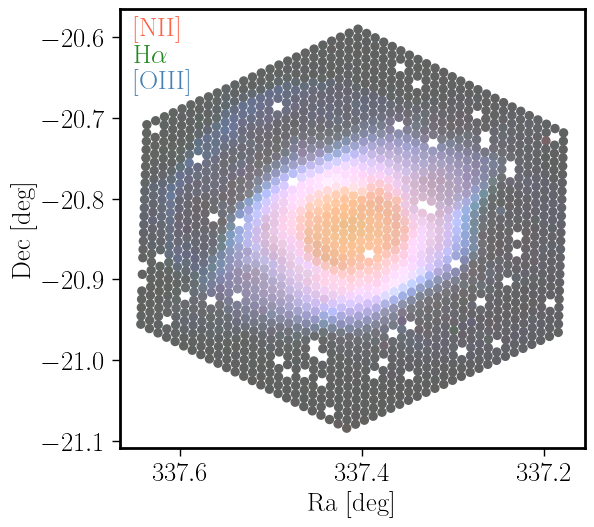

In [27]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

This cell repeats the RGB map using the **second parametric analysis** (`pek`), which in DR20 is the preferred parametric product for strong lines because it uses the gas-only spectrum after refinement of the stellar model.

Comparing this panel with the previous one helps diagnose how much the second iteration improves the emission-line recovery.

min/max:-1000/50000.0


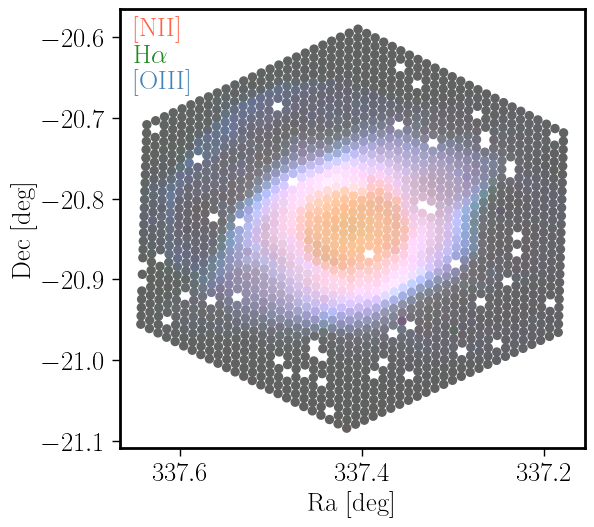

In [28]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_pek_6583.45','flux_pek_6562.85','flux_pek_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

This RGB map uses the **non-parametric** flux measurements for the same three lines.  
These are often the most convenient products for broad line surveys and for weak-line analyses, because the non-parametric procedure is run on a much larger set of emission lines.

For the Helix, this map should recover the classical ionization stratification discussed in the paper:
- [O III] concentrated toward the inner ring,
- Hα tracing the full ionized shell,
- [N II] becoming stronger near and beyond the outer edge of the [O III]-bright ring.

min/max:-1000/50000.0


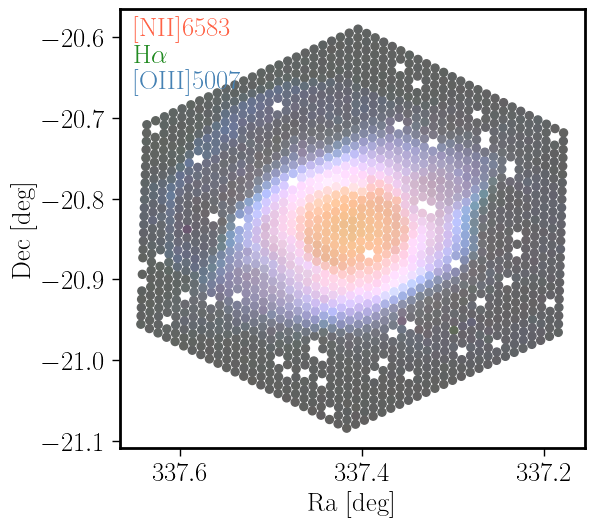

In [29]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_6583.45','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]6583',r'H$\alpha$','[OIII]5007'), filename='Helix_PN',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

## 4. RGB map of faint diagnostic lines

This composite highlights much fainter transitions:
- [N II] 5755
- Hε
- [O III] 4363

These are astrophysically important because auroral and high-order Balmer lines are among the key diagnostics of electron temperature and line-measurement sensitivity.  
In the Helix paper, the ability to map lines like [O III] 4363 and [N II] 5755 over a large area is one of the strongest demonstrations of the depth and uniformity of the LVM+DAP analysis.

[WARNING]: /tmp/ipykernel_730594/2202648745.py:61: RuntimeWarning: invalid value encountered in power
  g=g**gamma



min/max:-10/500.0


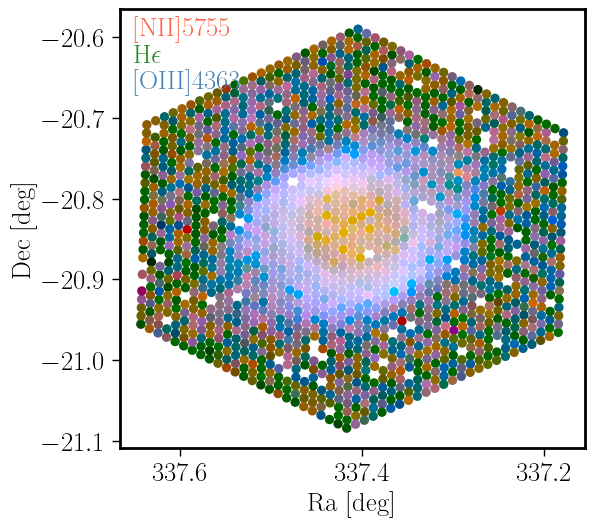

In [30]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_5754.59','flux_Hepsilon_3970.07','flux_[OIII]_4363.21'), \
                 rgb_scale = (1,0.1,1), \
                 vmin=-10, vmax=500.0,\
                 titles=('[NII]5755',r'H$\epsilon$','[OIII]4363'), filename='Helix_PN_faint',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

This RGB map replaces the red channel with [S III] 9531, a high-ionization tracer in the near-infrared arm.  
Together with Hα and [O III], it helps compare how different ionization zones are sampled across the full LVM wavelength range.

It is also a useful reminder that the DAP products combine measurements from the blue, red, and infrared arms into a unified per-fiber analysis.

[WARNING]: /tmp/ipykernel_730594/2202648745.py:61: RuntimeWarning: invalid value encountered in power
  g=g**gamma



min/max:-100/20000.0


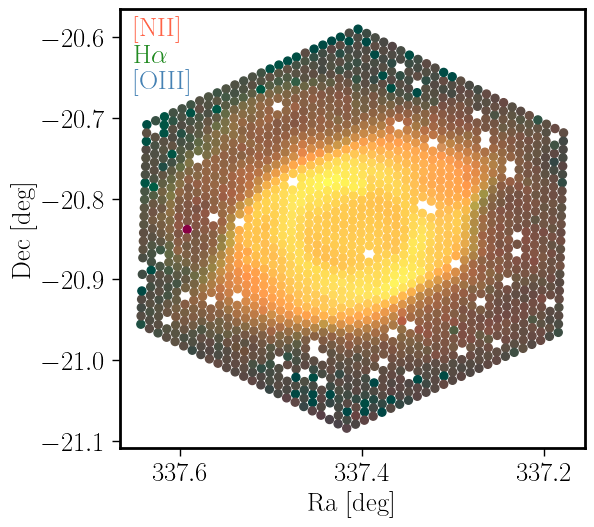

In [41]:
colors_t=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[SIII]_9531.1','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (3,0.5,0.15), \
                 vmin=-100, vmax=20000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix_SIII',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

## 5. BPT diagnostic diagrams and ionization structure

This cell shows three classical **BPT diagnostic diagrams**, comparing:
- log([O III] λ5007 / Hβ) vs log([N II] λ6583 / Hα)  
- log([O III] λ5007 / Hβ) vs log([S II] 6717,31 / Hα)  
- log([O III] λ5007 / Hβ) vs log([O II] 3727 / Hβ)  

These diagrams use ratios of strong emission lines to probe the **physical conditions and ionization mechanisms** of the gas. In particular:
- **[O III]/Hβ** traces the hardness of the ionizing radiation field and the ionization parameter,  
- **[N II]/Hα, [S II]/Hα, [O II]/Hβ** are sensitive to metallicity, density, and the structure of partially ionized zones. :contentReference[oaicite:0]{index=0}  

In galaxy studies, these diagrams are commonly used to distinguish between ionization sources (e.g., star formation vs AGN), since harder radiation fields enhance forbidden lines relative to recombination lines. :contentReference[oaicite:1]{index=1}  

In this notebook, each point corresponds to an individual **fiber**, and the color coding follows the RGB composite shown previously:
- **blue → [O III] (high-ionization gas)**  
- **green → Hα (overall ionized gas distribution)**  
- **red → [N II] (low-ionization gas / ionization front regions)**  

This color mapping helps connect the position of each point in the diagram with its spatial location in the nebula.

For a resolved nebula like the Helix, the interpretation differs from the classical (integrated) use of BPT diagrams:
- each point traces **local physical conditions**, not a global ionization source,
- the distribution reflects **spatial variations in ionization, density, and temperature** across the nebula,
- therefore, the location of points in the diagram should **not be interpreted as a classification (e.g., AGN vs star-forming)**, but rather as a continuous mapping of the ionization structure.

In this context, the diagrams provide a powerful way to link:
- spatially resolved maps (previous RGB images),  
- with physical diagnostics of the ionized gas across the nebula.

[WARNING]: /tmp/ipykernel_730594/4291635509.py:56: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_730594/4291635509.py:57: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)

[WARNING]: /tmp/ipykernel_730594/4291635509.py:58: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)

[WARNING]: /tmp/ipykernel_730594/4291635509.py:59: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)

[WARNING]: /tmp/ipykernel_730594/4291635509.py:60: RuntimeWarning: invalid value encountered in log10
  O2=np.log10(OII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_730594/4291635509.py:61: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))

[WARNING]: /tmp/ipykernel_730594/4291635509.py:62: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.

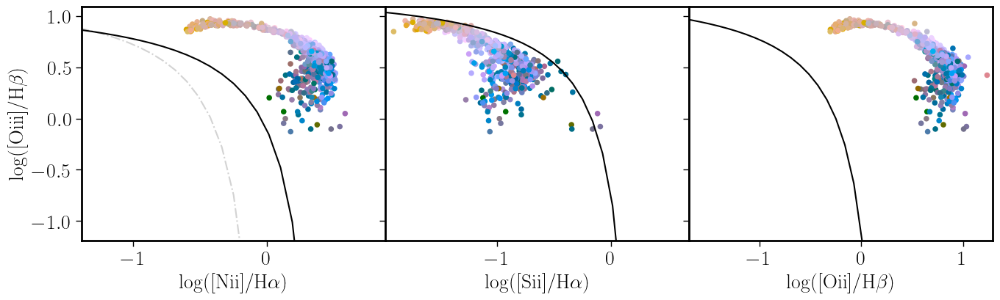

In [43]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
OII=tab_DAP['flux_[OII]_3726.03']+tab_DAP['flux_[OII]_3728.82']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
eOII=np.sqrt(tab_DAP['e_flux_[OII]_3726.03']**2+tab_DAP['e_flux_[OII]_3728.82']**2)
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
O2=np.log10(OII)-np.log10(Hb)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OII=0.73/((x-0.3))+1.33;#+1.10;
cut_y_OII_AGNs=1.18*(x)+0.36;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<0],cut_y3[x<0],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.5],cut_y4[x<0.5],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
axes[0,2].plot(x[x<0.3],cut_y_OII[x<0.3],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oii]/H$\beta$)')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min1-0.6,x_max1-0.2)
axes[0,2].set_xlim(x_min1-0.3,x_max1+0.4)
axes[0,0].set_ylim(y_min1+0.1,y_max1+0.1)





plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_ORION.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

## Classical BPT diagrams, now including the [O I]-based diagnostic

This cell shows three classical emission-line diagnostic diagrams, using the same color coding adopted in the previous RGB maps:
- **blue**: [O III] λ5007  
- **green**: Hα  
- **red**: [N II] λ6583  

The panels correspond to:
- log([O III] λ5007 / Hβ) vs log([N II] λ6583 / Hα),
- log([O III] λ5007 / Hβ) vs log([S II] λλ6717,6731 / Hα),
- log([O III] λ5007 / Hβ) vs log([O I] λ6300 / Hα).

These are the classical **BPT / Veilleux-Osterbrock** diagnostics, widely used to compare different ionization regimes through strong optical line ratios. In galaxy studies, they are often used to separate gas ionized by young stars, AGN radiation, or shocks, with the standard demarcation curves shown here as reference. 

In this notebook, however, each point corresponds to an individual **fiber** in a **resolved nebula**, not to an integrated galaxy or a single globally ionized structure. Therefore, the location of the points in these diagrams should **not** be interpreted in the same straightforward classification sense used for galaxies. Instead, the distribution reflects **local variations** in excitation, ionization parameter, density, temperature, and the presence of partially ionized zones across the nebula. Spatially resolved line-ratio diagrams are useful because they connect the morphology seen in the RGB maps with the physical conditions of the gas. 

For the Helix Nebula, this means that fibers associated with the inner high-excitation regions tend to occupy different parts of the diagrams than fibers located in the outer low-ionization ring, where [N II], [S II], and [O I] become enhanced. This behavior is consistent with the ionization stratification discussed in the Helix analysis. 

The third panel uses **[O I] λ6300**, which is particularly interesting because it traces partially ionized gas and transition regions, but it must be interpreted with extra caution: in the Helix DAP analysis this line was identified as one of the transitions that can be significantly affected by imperfect night-sky subtraction, and an a posteriori background correction was applied to it. Therefore, structure seen in the [O I]-based diagram may partly reflect real nebular conditions and partly residual sky contamination if the correction is not properly taken into account. :contentReference[oaicite:3]{index=3}

[WARNING]: /tmp/ipykernel_730594/683774227.py:54: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_730594/683774227.py:55: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)

[WARNING]: /tmp/ipykernel_730594/683774227.py:56: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)

[WARNING]: /tmp/ipykernel_730594/683774227.py:57: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)

[WARNING]: /tmp/ipykernel_730594/683774227.py:58: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))

[WARNING]: /tmp/ipykernel_730594/683774227.py:59: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])

[WARNING]: /tmp/ipykernel_730594/683774227.py:81: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7

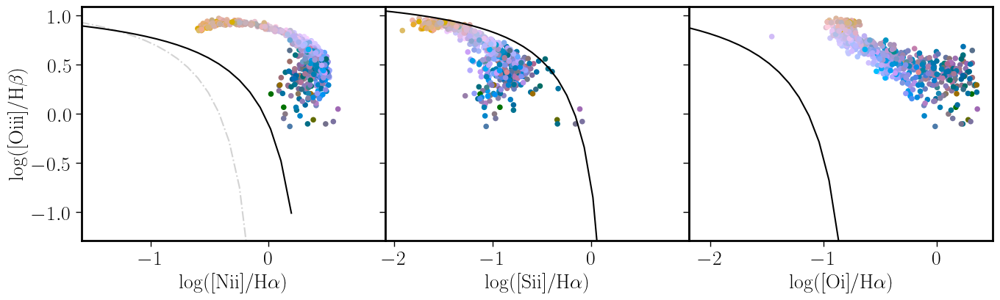

In [44]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<-0.1],cut_y3[x<-0.1],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.2],cut_y4[x<0.2],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
axes[0,0].set_xlim(x_min1-0.2,x_max1+0.1)
axes[0,1].set_xlim(x_min1-0.7,x_max1+0.1)
axes[0,2].set_xlim(x_min1-0.8,x_max1-0.4)
axes[0,0].set_ylim(y_min1,y_max1+0.1)
axes[0,1].set_ylim(y_min1,y_max1+0.1)
axes[0,2].set_ylim(y_min1,y_max1+0.1)






plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_HELIX_OI.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

## B. Build an integrated line catalog from the per-fiber DAP products

## 6. Compute integrated fluxes the emission lines based on the non-parametric analysis

This cell scans the table for all columns beginning with `flux_`, excludes stellar and parametric variants, and computes the **summed flux** and associated uncertainty across the field.

This is the notebook equivalent of building an integrated emission-line catalog from the per-fiber DAP products.  
In the Helix paper, integrated fluxes were used to identify a high-quality line sample and to compare the LVM measurements with the historical literature.

In [45]:
#
# Lines with enough S/N
#
#tab_sum_flux=Table()
name_cols=[]
w_sum = []
sum_flux=[]
e_sum_flux=[]


col_flux=search_col(tab_DAP,'flux_')
print ('------------------------------------\n')
#col_flux_np=[]
for cols in col_flux:
#    print (cols,cols.find('e_'))
    if ((cols.find('e_')==-1) and (cols.find('pe_')==-1) and (cols.find('st')==-1)  and (cols.find('pek_')==-1) ):
        a_cols=cols.split('_') 
        w_now=a_cols[-1]
        e_cols='e_'+cols
        name_cols.append(cols)
        w_sum.append(float(w_now))
        sum_flux_now=np.nansum(tab_DAP[cols])
        e_sum_flux_now=np.sqrt(np.nansum((tab_DAP[e_cols]**2)))
        sum_flux.append(sum_flux_now)
        e_sum_flux.append(e_sum_flux_now)

name_cols=np.array(name_cols)
sum_flux=np.array(sum_flux)
e_sum_flux=np.array(e_sum_flux)
tab_sum_flux=Table((name_cols,w_sum,sum_flux,e_sum_flux),names=('eline','wave','flux','e_flux'))


flux_st
med_flux_st
e_med_flux_st
flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3734.37
flux_HI_3750.15
flux_[FeVII]_3758.9
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_CaII_3933.66
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_[SII]_4068.6
flux_[SII]_4076.35
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_[FeII]_4177.21
flux_[FeV]_4227.2
flux_[FeII]_4243.98
flux_CII_4267.0
flux_[FeII]_4287.4
flux_Hgamma_4340.49
flux_[FeII]_4358.1
flux_[FeII]_4358.37
flux_[FeII]_4359.34
flux_[OIII]_4363.21
flux_[FeII]_4413.78
flux_[FeII]_4414.45
flux_[FeII]_4416.27
flux_[FeII]_4452.11
flux_[FeII]_4457.95
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_[NiII]_4485.21
flux_[MgI]_4562.48
flux_MgI]_4571.1
flux_[FeII]_4632.27
flux_[FeIII]_4658.1
flux_HeII_4685.68
flux_[FeIII]_4701.62
flux_[A

A quick sanity check: how many candidate lines were collected into the summary table.

In [46]:
print(len(tab_sum_flux))

215


This cell computes the integrated signal-to-noise ratio for each line and retains the subset with `SN > 10`.  
This is a practical selection for building a clean sample of robust detections before generating maps or tables.

The philosophy is similar to the “golden sample” discussion in the Helix paper, where only well-detected lines are retained for scientific interpretation.

In [47]:
#tab_sum_flux
SN = tab_sum_flux['flux']/tab_sum_flux['e_flux']
try:
    tab_sum_flux.add_column(SN,name='SN')
except:
    print('SN not needed')
tab_sum_flux_good = tab_sum_flux[SN>10]
print(len(tab_sum_flux_good))

tab_sum_flux.sort('flux',reverse=True)



tab_sum_flux[0:36]

55


eline,wave,flux,e_flux,SN
str21,float64,float64,float64,float64
flux_[NII]_6583.45,6583.45,15031632.71933053,30357.190326626216,495.15889176826494
flux_[OIII]_5006.84,5006.84,14964812.606783416,35324.58925435741,423.6372714493051
flux_Halpha_6562.85,6562.85,8373280.546647843,2012.2495545052002,4161.154131156849
flux_[OII]_3728.82,3728.82,7406704.644747626,4212.147465820748,1758.4153225519635
flux_[OII]_3726.03,3726.03,5520732.277634869,4531.687719648637,1218.2508193796987
flux_[OI]_6300.3,6300.3,4981429.135898313,2399.345648052597,2076.1615317665614
flux_[OIII]_4958.91,4958.91,4879187.688428344,104869.07246408734,46.52646937541317
flux_[NII]_6548.05,6548.05,4830567.780261527,91741.7869723707,52.65395344562363
flux_Hbeta_4861.36,4861.36,2853830.6822103066,7763.731282353152,367.5849380177573


## C. Generic map helpers for individual DAP quantities

## 7. Define a generic helper to plot a single DAP quantity on the sky

This function builds a scatter map of one selected DAP column using the fiber sky coordinates.  
It is the basic tool used later for line-flux maps, stellar-parameter maps, velocity maps, and similar products.

Because LVM DAP products are fiber-based rather than image-based, most spatial visualization begins with this sort of function.

In [50]:
def map_plot_DAP(tab_DAP,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None):

    rc.update({'font.size': 19,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19,\
               'ytick.labelsize' : 19,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)
    print(line,vmin,vmax)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize/1.3))
    norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
    scat=scatter(X, Y, ax, size=sf*35.6/3600, c=C, cmap=cmap, norm=norm)

    ax.set_xlabel('Ra [deg]')
    ax.set_ylabel('Dec [deg]')
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*(yy[1]-yy[0]),title,color='black',\
            bbox=props)
    ax.text(xx[1]-0.52*(xx[1]-xx[0]),yy[0]+0.06*(yy[1]-yy[0]),r'10$^{-16}$ erg/s/cm$^2$',color='black',\
            bbox=props)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(scat.sc, cax=cax, format='%.0e')
    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])

    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}')
    plt.close()


This is a slightly more flexible version of the previous helper that plots into a user-provided axis.  
It is ideal for multi-panel figures and for publication layouts.

Most of the science figures in the rest of the notebook are built with this function.

In [51]:
def map_plot_DAP_ax(tab_DAP,ax=None,fig=None,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,xlab=True,ylab=True, fs=1.0,f_scale=1e7):

    rc.update({'font.size': 19*fs,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19*fs,\
               'ytick.labelsize' : 19*fs,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6*fs,\
               'ytick.major.size'        :   6*fs,\
               'xtick.minor.size'        :   3*fs,\
               'ytick.minor.size'        :   3*fs,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]/f_scale    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)

    if (gamma>0):
        norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
        size_sc = sf*35.6/3600
        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, norm=norm, rasterized=True)
    else:

        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, vmin=vmin, vmax=vmax, rasterized=True)

    if (xlab == True):
        ax.set_xlabel('Ra [deg]',fontsize=19*fs)
    if (ylab == True):
        ax.set_ylabel('Dec [deg]',fontsize=19*fs)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*fs*(yy[1]-yy[0]),rf'{title}',color='black',\
            bbox=props)

    return scat



## Comparison of Hα flux products

The left panel shows the spatial distribution of the Hα flux derived from the **non-parametric** DAP analysis, which is the most convenient product for mapping the nebular emission over the full field. The right panel compares the Hα flux measured with the non-parametric method against the value derived from the **second parametric fit** (`PEK`), which is optimized for strong lines after refinement of the stellar-continuum subtraction. Agreement between both measurements indicates that the line is robustly recovered, while deviations usually become more important in low-signal fibers or in regions affected by background residuals.

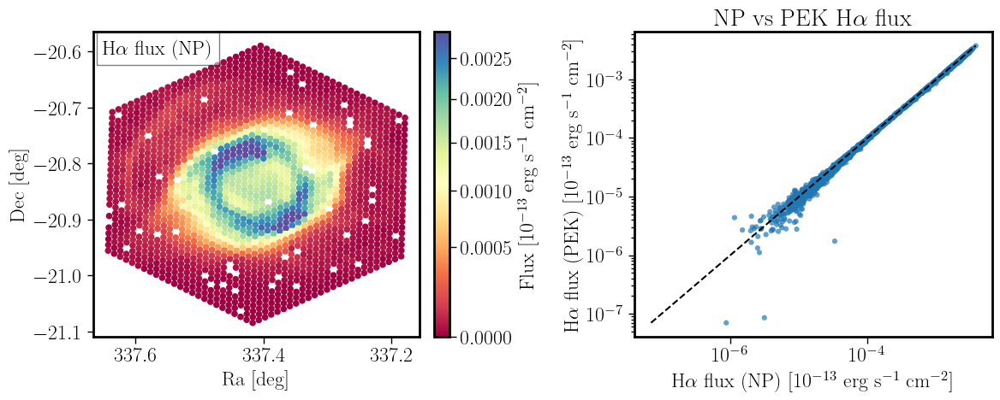

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# --------------------------------------------------
# Left panel: Halpha flux map (NP measurement)
# --------------------------------------------------
line_np = 'flux_Halpha_6562.85'

C_np = tab_DAP[line_np] / 1e7
good_map = np.isfinite(C_np) & (C_np > 0)

if np.any(good_map):
    vmin_map = np.nanpercentile(C_np[good_map], 5)
    vmax_map = np.nanpercentile(C_np[good_map], 99)
else:
    vmin_map, vmax_map = 0, 1

scat = map_plot_DAP_ax(
    tab_DAP,
    ax=axes[0],
    line=line_np,
    vmin=vmin_map,
    vmax=vmax_map,
    title=r'H$\alpha$ flux (NP)',
    cmap='Spectral',
    gamma=0.7,
    sf=2,
    xlab=True,
    ylab=True,
    fs=0.9,
    f_scale=1e7
)

cb = fig.colorbar(scat, ax=axes[0], fraction=0.046, pad=0.04)
cb.set_label(r'Flux [$10^{-13}$ erg s$^{-1}$ cm$^{-2}$]')

# --------------------------------------------------
# Right panel: NP vs PEK comparison
# --------------------------------------------------
line_pek = 'flux_pek_6562.85'

Ha_np = tab_DAP[line_np]
Ha_pek = tab_DAP[line_pek]

mask = (
    np.isfinite(Ha_np) & np.isfinite(Ha_pek) &
    (Ha_np > 0) & (Ha_pek > 0)
)

axes[1].scatter(
    Ha_np[mask] / 1e7,
    Ha_pek[mask] / 1e7,
    s=20,
    alpha=0.7,
    edgecolor='none'
)

if np.any(mask):
    lo = min(np.nanmin(Ha_np[mask]), np.nanmin(Ha_pek[mask])) / 1e7
    hi = max(np.nanmax(Ha_np[mask]), np.nanmax(Ha_pek[mask])) / 1e7
    axes[1].plot([lo, hi], [lo, hi], '--', color='black', lw=1.5)

axes[1].set_xlabel(r'H$\alpha$ flux (NP) [$10^{-13}$ erg s$^{-1}$ cm$^{-2}$]')
axes[1].set_ylabel(r'H$\alpha$ flux (PEK) [$10^{-13}$ erg s$^{-1}$ cm$^{-2}$]')
axes[1].set_title(r'NP vs PEK H$\alpha$ flux')
axes[1].set_xscale('log')
axes[1].set_yscale('log')

plt.tight_layout()
plt.show()

## D. Kinematics and line-by-line spatial structure

## 8. Hα kinematics: velocity and velocity dispersion

This figure reproduces one of the core physical results of the Helix analysis:
- the Hα velocity field,
- and the Hα velocity-dispersion field.

In the Helix paper, the velocity map shows a large-scale redshifted/blueshifted symmetry consistent with a slowly expanding, moderately inclined shell.  
The velocity-dispersion map is generally narrow, with somewhat broader profiles in the inner cavity and the brightest ring, consistent with thermal broadening plus modest unresolved turbulent motions.

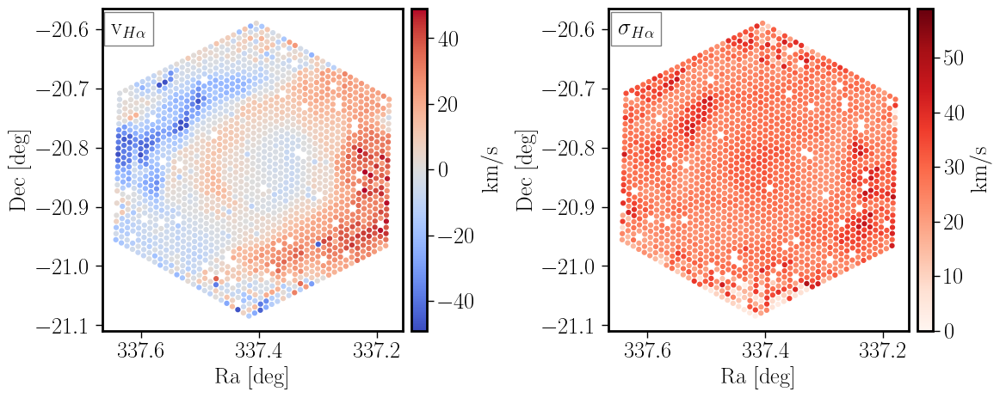

In [61]:
fig, axes = plt.subplots(1,2,figsize=(12,5))
#cmap_now = 'Spectral_r'
#cmap_now = 'turbo'
cmap_now = 'coolwarm'
#np.zeros(len(tab_DAP),dtype=int)
filename=f'Helix_{DRVER}_kin'
xlab = True
ylab = True
ax = axes[0]
mask_cen = ((tab_DAP['dec']>(-20.85-0.025)) & (tab_DAP['dec']<-20.85+0.025)) & ((tab_DAP['ra']>(337.40-0.05)) & (tab_DAP['ra']<(337.40+0.05)))        
mean_vel = np.nanmedian(tab_DAP['vel_pek_6562.85'][mask_cen])
tab_DAP['vel_off'] = tab_DAP['vel_pek_6562.85'] - mean_vel
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_off', \
                 vmin=-49, vmax=49, title=r'v$_{H\alpha}$', filename=filename,\
             cmap=cmap_now, fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)

ax = axes[1]
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='sigma_kms_pek_6562.85', \
                 vmin=0, vmax=59, title=r'$\sigma_{H\alpha}$', filename=filename,\
             cmap='Reds', fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)

#ax.set_ylabel('')


plt.tight_layout(w_pad=0.5)


fig.savefig(f'{DIR_FIG}/kin.pdf', facecolor='white')


## 9. Gallery of the brightest emission-line maps

This multi-panel figure displays the strongest lines in the field one by one.  
It is one of the most informative sections of the notebook because it lets you compare spatial morphology across ions and transitions.

In the Helix paper, the bright-line maps reveal:
- Balmer lines tracing the full ionized shell,
- [O III] emphasizing the high-excitation inner ring,
- [N II], [O II], and [S II] tracing the lower-ionization outer structures and ionization front.

Sky median [NII]6583.45: 1181.0137171696788 +/- 14963.506835391994  
Sky median [OIII]5006.84: 482.23112638589765 +/- 16339.476765449135  
Sky median H$\alpha$6562.85: 617.2109974944133 +/- 7600.284172591888  
Sky median [OII]3728.82: 734.9579283169076 +/- 7237.43974702756  
Sky median [OII]3726.03: 579.0777735923402 +/- 5381.026770435713  
Sky median [OI]6300.3: 2506.801805364504 +/- 832.3807635864367  ***
Sky median [OIII]4958.91: 154.79937973981123 +/- 5340.240673470719  
Sky median [NII]6548.05: 368.8091433981674 +/- 4855.144925506079  
Sky median H$\beta$4861.36: 229.05743214388167 +/- 2601.7211259647215  
Sky median [NeIII]3868.75: 157.0303092581225 +/- 2274.7504462373963  
Sky median [OI]5577.34: 1159.595216504849 +/- 134.0501026572485  ***
Sky median [OI]6363.78: 846.5883009848355 +/- 267.9741544006036  ***
Sky median H$\gamma$4340.49: 125.04565634667523 +/- 1188.7245536509504  
Sky median [NeIII]3967.46: 68.55128182356904 +/- 757.2739806064784  
Sky median H$\delta$4101.77: 11

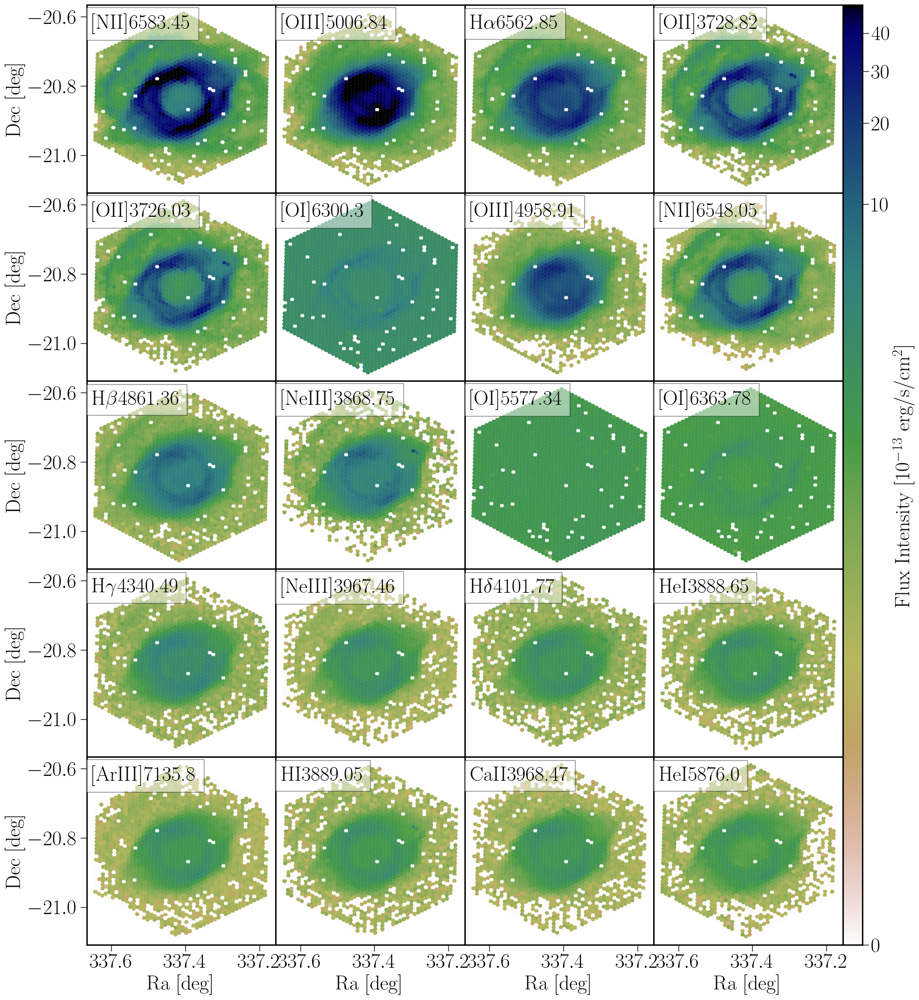

In [63]:
gamma=0.15
cmap = 'gist_earth_r'
NX=4
NY=5
fs=1.6
f_scale=1e3
fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


for I,ax in enumerate(np.ravel(axs)):
    #print(ax)
    tab_now=tab_sum_flux[I]
    eline=tab_now['eline']
    wave=np.ceil(tab_now['wave'])
    II=str(I)
    if (I<10):
        II='0'+str(I)
    filename=f'Helix_{II}_{wave}'
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    xlab = False
    ylab = False
    if ((I/NX)==int(I/NX)):
        ylab=True
    else:
        ax.set_yticks([])
    if (I>=(NX*NY-4)):
        xlab=True
    else:
        ax.set_xticks([])
    vmin=0
    vmax=0.49e5
#    vmax=8e5
    mask_sky = (tab_DAP['dec']<-20.5) | (tab_DAP['dec']>-21.2)

    med_sky = np.median(tab_DAP[eline][mask_sky])
    std_sky = np.std(tab_DAP[eline][mask_sky])
    if (med_sky>2*std_sky):
        label = '***'
    else:
        label = ''
    print(f'Sky median {title}: {med_sky} +/- {std_sky}  {label}')

    scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                 vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    #print(xx,yy)
    
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)    
cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')

plt.subplots_adjust(wspace=0,hspace=0)
plt.show()    
#fig.tight_layout(w_pad=0.2)
fig.savefig(f'figs/Helix_felines.pdf', facecolor='white')

#if (I>3):
    #    break

## E. Separate analysis modes and generate all-line maps

## 10. Separate parametric and non-parametric line products

This cell splits the selected line list into:
- `pek`: second parametric analysis,
- `pe`: first parametric analysis,
- and the remaining non-parametric products.

This distinction is important in DR20:
- the parametric products are usually best for strong, well-modeled lines,
- the non-parametric products are essential for the larger line catalog and for many weak features.

In [66]:
elines_pek = tab_sum_flux_good['eline'][[entry.find('_pek_') > -1 for entry in tab_sum_flux_good['eline']]]
elines_pe = tab_sum_flux_good['eline'][[entry.find('_pe_') > -1 for entry in tab_sum_flux_good['eline']]]
mask_pek = [entry in elines_pek for entry in tab_sum_flux_good['eline']]
mask_pe = [entry in elines_pe for entry in tab_sum_flux_good['eline']]
mask_np = ~ (np.array(mask_pek) | np.array(mask_pe))
tab_sum_flux_good['good'] = 1


## 11. Gallery of good non-parametric lines

This figure loops over the non-parametric good-line sample and generates a large panel of line maps.  
This is conceptually similar to the “all-line” presentation in the paper, where the brightest and faintest detected transitions are compared on equal footing.

A particularly important point for the Helix is that weak auroral lines can still be mapped over a substantial area, demonstrating the sensitivity of the DAP analysis.

# NP good lines:  55


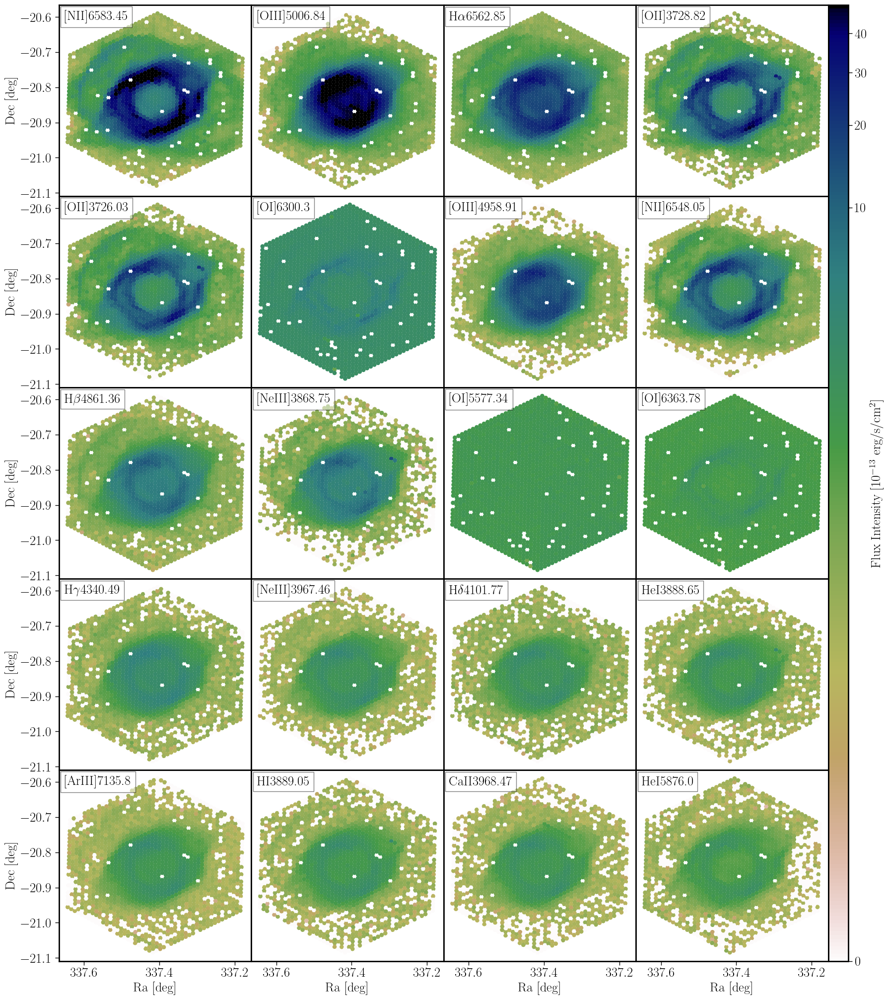

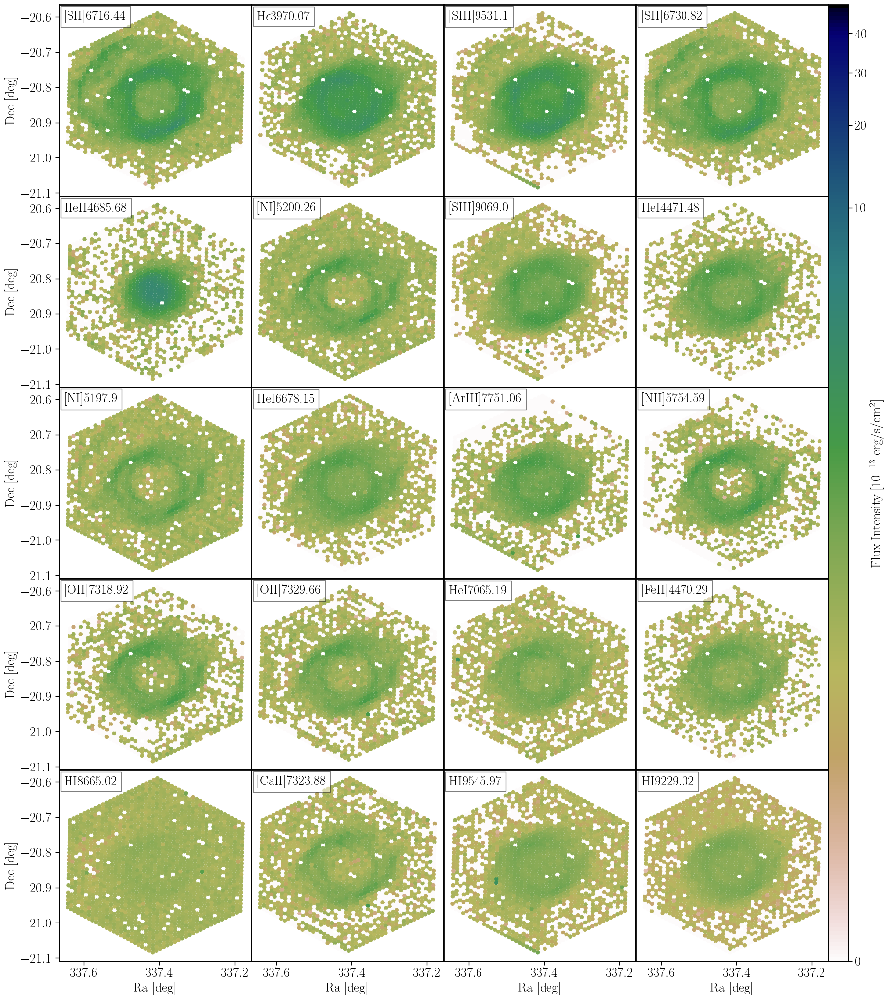

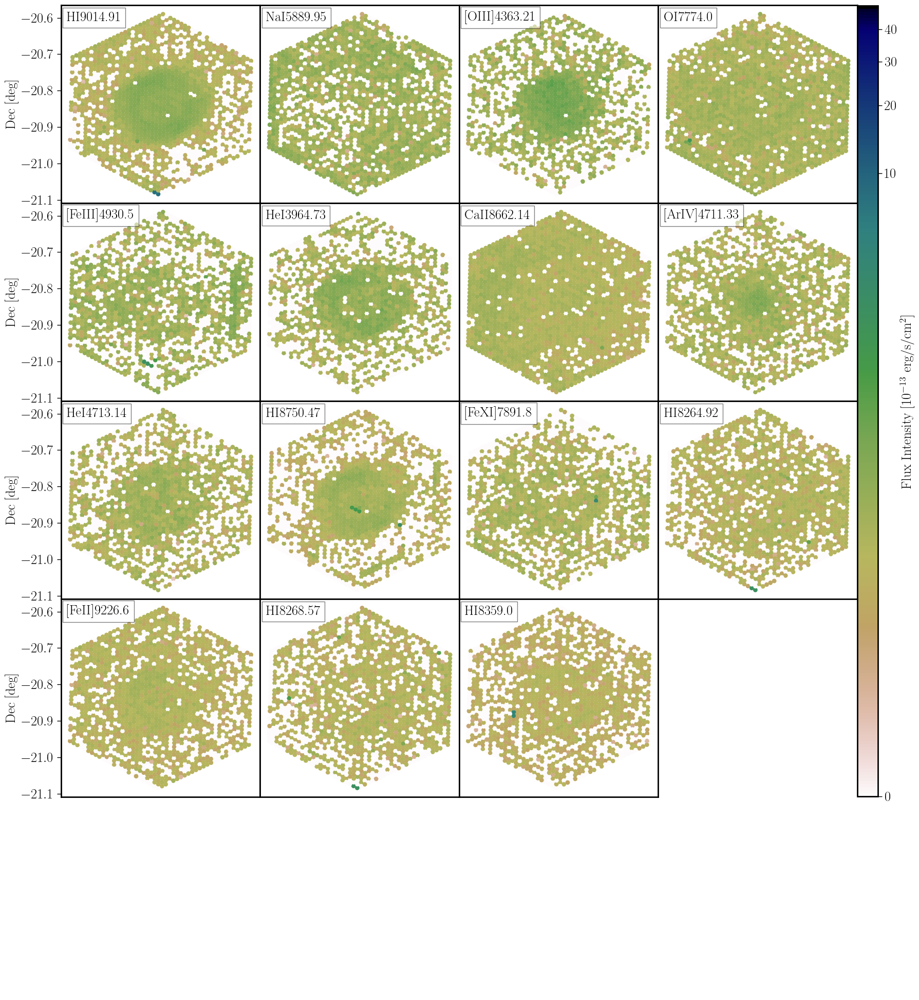

In [67]:

NX=4
NY=5
I_now=0

tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))
tab_sum_flux.sort('flux',reverse=True)
cax_pos = 1
for I0 in np.arange(0,len(tab_sum_flux),NX*NY):
    fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


    #axs_flat = axs.flatten
    for I,ax in enumerate(np.ravel(axs)):
        #print(ax)
        I_now = I0 + I
        if (I_now >= len(tab_sum_flux)):
            ax.set_yticks([])
            ax.set_xticks([])
            ax.set_axis_off()
            cax_pos = 2

#            break
        else:
            tab_now=tab_sum_flux[I+I0]
            eline=tab_now['eline']
            wave=np.ceil(tab_now['wave'])
            II=str(I)
            if (I<10):
                II='0'+str(I)
            filename=f'Helix_{II}_{wave}'
            title=eline.replace('flux_','')
            title=title.replace('_','')
            title=title.replace('flux','')
            title=title.replace('alpha','$\\alpha$')
            title=title.replace('beta','$\\beta$')
            title=title.replace('gamma','$\\gamma$')    
            title=title.replace('delta','$\\delta$')
            title=title.replace('epsilon','$\\epsilon$')    
            xlab = False
            ylab = False
            if ((I/NX)==int(I/NX)):
                ylab=True
            else:
                ax.set_yticks([])
            if (I>=(NX*NY-4)):
                xlab=True
            else:
                ax.set_xticks([])                
            vmin=0
            vmax=0.49e5
        
            scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                             vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
        
#        scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline,vmin=0, vmax=vmax, title=title, filename=filename, cmap=cmap, fsize=6.5,\
#                             figs_dir='figs',gamma=gamma,fig_type='pdf',xlab=xlab,ylab=ylab,sf=2.8)
        xx = ax.get_xlim()
        yy = ax.get_ylim()
        #print(xx,yy)
    if (cax_pos == 1):
        cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
    else:
        cax = fig.add_axes([0.9, 0.2645, 0.02, 0.615])  # Ajusta estos valores según necesites
    #cax = fig.add_axes([0.9, 0.125, 0.02, 0.755])     
#    cax = fig.add_axes([0.9, 0.11, 0.02, 0.77]) 
#    cax = fig.add_axes([0.9, 0.125, 0.02, 0.76])  # Ajusta estos valores según necesites
    cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
    cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
    plt.subplots_adjust(wspace=0,hspace=0)
    plt.show()    
    #fig.tight_layout(w_pad=0.2)
    fig.savefig(f'figs/Helix_felines_{I_now}.pdf', facecolor='white')
    I_now=I_now+1

#if (I>3):
    #    break

This cell explicitly defines the final set of good non-parametric lines after filtering.  
It is the working subset for the exported line list and several later plots.

In [68]:
tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))

# NP good lines:  55


## 12. Export the selected line summary table

The selected line catalog is written to disk as an ECSV file.  
This is useful for downstream analysis, tables for a paper, or exchange with collaborators.

In [69]:
tab_sec_sum = Table()
tab_sec_sum['eline'] = tab_sum_flux['eline']
tab_sec_sum.write(f'{DIR_CACHE}/m_Helix_{DRVER}_lines_sum.ecsv',format='ascii.ecsv',overwrite=True)

## F. Prepare paper-style integrated line tables

## 13. Prepare a formatted integrated-flux table

This cell converts the selected line names into display-ready labels and rescales the integrated fluxes.  
It is mainly bookkeeping, but it is the first step toward producing a publication-style line list.

In [70]:
a_name=[]
a_flux=[]
a_e_flux=[]
n_cut = 0
for flux,e_flux,eline in zip(tab_sum_flux['flux'],tab_sum_flux['e_flux'],tab_sum_flux['eline']):
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')   
    a_name.append(title)
    a_flux.append(flux/1000)
    a_e_flux.append(e_flux/1000)
    n_cut=n_cut+1

a_name=np.array(a_name)
a_flux=np.array(a_flux)
a_e_flux=np.array(a_e_flux)
print(n_cut)

55


This cell cleans and reformats the line names and wavelengths so they can be exported into a compact human-readable table.  
It is particularly useful if you want to compare directly with a published line table or generate LaTeX-ready output.

In [71]:
aa_name=[]
aa_wave=[]
#n_cut = 3
for I in range(n_cut):
    wave=''.join(filter(str.isdigit, a_name[I]))
    name=''.join(filter(lambda c: not c.isdigit(), a_name[I]))
    name = name.replace('.','')
    name = name.replace('[','$[$\ION{')
    name = name.replace(']','}{}$]$')

    if (len(wave)==5):
        wave = wave+'0'
    wave=np.around(float(wave)/100,2)
    print(f'{name} {wave}')
    aa_name.append(name)
    aa_wave.append(wave)
aa_name=np.array(aa_name)
aa_wave=np.array(aa_wave)

$[$\ION{OII}{}$]$ 3726.03
$[$\ION{OII}{}$]$ 3728.82
$[$\ION{NeIII}{}$]$ 3868.75
HeI 3888.65
HI 3889.05
HeI 3964.73
$[$\ION{NeIII}{}$]$ 3967.46
CaII 3968.47
H$\epsilon$ 3970.07
H$\delta$ 4101.77
H$\gamma$ 4340.49
$[$\ION{OIII}{}$]$ 4363.21
$[$\ION{FeII}{}$]$ 4470.29
HeI 4471.48
HeII 4685.68
$[$\ION{ArIV}{}$]$ 4711.33
HeI 4713.14
H$\beta$ 4861.36
$[$\ION{FeIII}{}$]$ 4930.5
$[$\ION{OIII}{}$]$ 4958.91
$[$\ION{OIII}{}$]$ 5006.84
$[$\ION{NI}{}$]$ 5197.9
$[$\ION{NI}{}$]$ 5200.26
$[$\ION{OI}{}$]$ 5577.34
$[$\ION{NII}{}$]$ 5754.59
HeI 5876.0
NaI 5889.95
$[$\ION{OI}{}$]$ 6300.3
$[$\ION{OI}{}$]$ 6363.78
$[$\ION{NII}{}$]$ 6548.05
H$\alpha$ 6562.85
$[$\ION{NII}{}$]$ 6583.45
HeI 6678.15
$[$\ION{SII}{}$]$ 6716.44
$[$\ION{SII}{}$]$ 6730.82
HeI 7065.19
$[$\ION{ArIII}{}$]$ 7135.8
$[$\ION{OII}{}$]$ 7318.92
$[$\ION{CaII}{}$]$ 7323.88
$[$\ION{OII}{}$]$ 7329.66
$[$\ION{ArIII}{}$]$ 7751.06
OI 7774.0
$[$\ION{FeXI}{}$]$ 7891.8
HI 8264.92
HI 8268.57
HI 8359.0
CaII 8662.14
HI 8665.02
HI 8750.47
HI 9014.91
$[$\IO

This cell prints the integrated line table in a compact three-column format.  
It is essentially a notebook-side version of a paper table.

In [72]:
n_c=int(n_cut/3)+1
for I in range(n_c):
    print(' %s  &  %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I],aa_wave[I],a_flux[I],a_e_flux[I]),end='')
    print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I+n_c],aa_wave[I+n_c],a_flux[I+n_c],a_e_flux[I+n_c]),end='')
    try:
        print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f \\\\' % (aa_name[I+2*n_c],aa_wave[I+2*n_c],a_flux[I+2*n_c],a_e_flux[I+2*n_c]))
    except:
        print('')
    

 $[$\ION{OII}{}$]$  &  3726.03 & 5520.73  $\pm$  4.53& $[$\ION{OIII}{}$]$  & 4958.91 & 4879.19  $\pm$ 104.87& $[$\ION{CaII}{}$]$  & 7323.88 & 86.78  $\pm$  3.95 \\
 $[$\ION{OII}{}$]$  &  3728.82 & 7406.70  $\pm$  4.21& $[$\ION{OIII}{}$]$  & 5006.84 & 14964.81  $\pm$ 35.32& $[$\ION{OII}{}$]$  & 7329.66 & 121.84  $\pm$  2.99 \\
 $[$\ION{NeIII}{}$]$  &  3868.75 & 2372.15  $\pm$  5.64& $[$\ION{NI}{}$]$  & 5197.90 & 163.16  $\pm$  1.88& $[$\ION{ArIII}{}$]$  & 7751.06 & 160.32  $\pm$  5.23 \\
 HeI  &  3888.65 & 708.32  $\pm$  3.30& $[$\ION{NI}{}$]$  & 5200.26 & 185.81  $\pm$  1.90& OI  & 7774.00 & 58.65  $\pm$  3.04 \\
 HI  &  3889.05 & 682.29  $\pm$  3.35& $[$\ION{OI}{}$]$  & 5577.34 & 2026.05  $\pm$  2.50& $[$\ION{FeXI}{}$]$  & 7891.80 & 22.50  $\pm$  2.09 \\
 HeI  &  3964.73 & 40.81  $\pm$  3.79& $[$\ION{NII}{}$]$  & 5754.59 & 152.00  $\pm$  2.93& HI  & 8264.92 & 21.67  $\pm$  1.89 \\
 $[$\ION{NeIII}{}$]$  &  3967.46 & 812.85  $\pm$  2.89& HeI  & 5876.00 & 544.84  $\pm$  3.70& HI  & 8268.

Here the notebook computes line ratios relative to Hβ for the hydrogen series.  
These ratios are useful for quick checks of calibration, extinction, and consistency with recombination expectations.

In general, Balmer ratios are among the standard internal consistency checks in nebular spectroscopy.

In [73]:
for I in range(n_cut):
    if (a_name[I].find('beta')>-1):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        FHb = a_flux[I]
        e_FHb = a_e_flux[I]
        
for I in range(n_cut):
    if ((a_name[I].find('alpha')>-1) or (a_name[I].find('gamma')>-1) or (a_name[I].find('delta')>-1) or (a_name[I].find('epsilon')>-1) or (a_name[I].find('HI')>-1)):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        rat = a_flux[I]/FHb
        e_rat = a_e_flux[I]/FHb+e_FHb*rat/FHb
        print(' %s/H$\\beta$  & %5.2f $\pm$ %5.2f' % (a_name[I],rat,e_rat))
        
        

 HI3889.05/H$\beta$  &  0.24 $\pm$  0.00
 H$\epsilon$3970.07/H$\beta$  &  0.17 $\pm$  0.00
 H$\delta$4101.77/H$\beta$  &  0.27 $\pm$  0.00
 H$\gamma$4340.49/H$\beta$  &  0.46 $\pm$  0.00
 H$\alpha$6562.85/H$\beta$  &  2.93 $\pm$  0.01
 HI8264.92/H$\beta$  &  0.01 $\pm$  0.00
 HI8268.57/H$\beta$  &  0.01 $\pm$  0.00
 HI8359.0/H$\beta$  &  0.01 $\pm$  0.00
 HI8665.02/H$\beta$  &  0.03 $\pm$  0.00
 HI8750.47/H$\beta$  &  0.01 $\pm$  0.00
 HI9014.91/H$\beta$  &  0.02 $\pm$  0.00
 HI9229.02/H$\beta$  &  0.02 $\pm$  0.00
 HI9545.97/H$\beta$  &  0.03 $\pm$  0.00


## G. Explore the stellar-continuum side of the DAP products

## 14. Select fibers with measurable stellar continuum

This section turns from gas to the stellar side of the DAP.  
The Helix is not an ideal field for stellar-population work because the nebula dominates and only a few fibers contain stars with moderate signal-to-noise.

The selection `SN_st > 5` is therefore a practical exploratory cut rather than a physically complete sample.

In [74]:
#
# Stars with SN>5
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 5
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]

This cell resets the plotting style for the stellar-parameter section.

In [75]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


This scatter plot shows the distribution of the DAP-derived stellar metallicity proxy `[Fe/H]` and alpha-enhancement `[α/Fe]` for the selected stellar fibers. Keep in min that those are "average" properties from a combination of stars analyzed using the RSP methodology. For a proper PDF we provide with a methodology included below.

For the Helix field, these points should be treated as field-star measurements.  
The Helix paper explicitly warns that the stellar results are not robust enough here to support physical conclusions about the nebula itself.

Text(0, 0.5, '[$\\alpha$/Fe]')

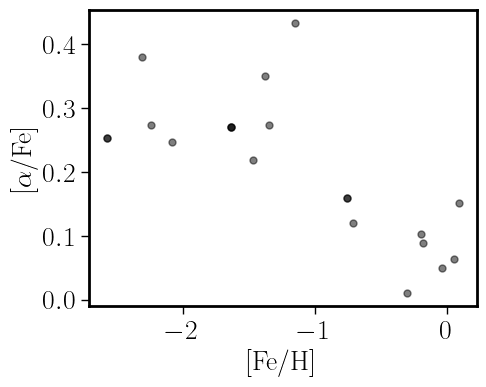

In [78]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],s=25,c='black',alpha=0.5)
ax.set_xlabel('[Fe/H]')
ax.set_ylabel(r'[$\alpha$/Fe]')

This scatter plot shows the distribution in `Teff` versus `log g` for the selected stellar fibers.  
Again, the point is mainly diagnostic: it reveals what part of parameter space is sampled by the stars bright enough to be detected in the field.

Text(0, 0.5, 'log(g)')

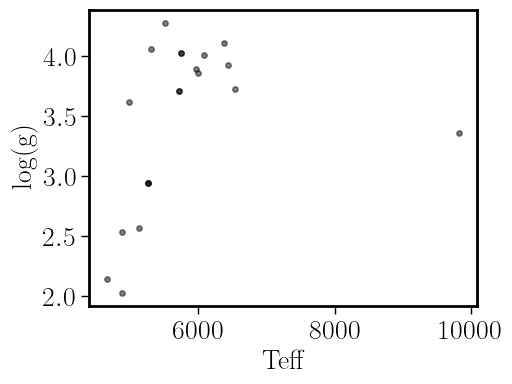

In [79]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Teff'],tab_DAP_st['Log_g'],s=15,c='black',alpha=0.5)
ax.set_xlabel('Teff')
ax.set_ylabel(r'log(g)')

## 15. Velocity map with overplotted stellar fibers

This plot revisits the velocity field and overlays the locations of the fibers with measurable stellar continuum.  
It is useful to see where the stars lie relative to the gas kinematics and to verify that the stars are sparse and not obviously tracing the nebular shell.

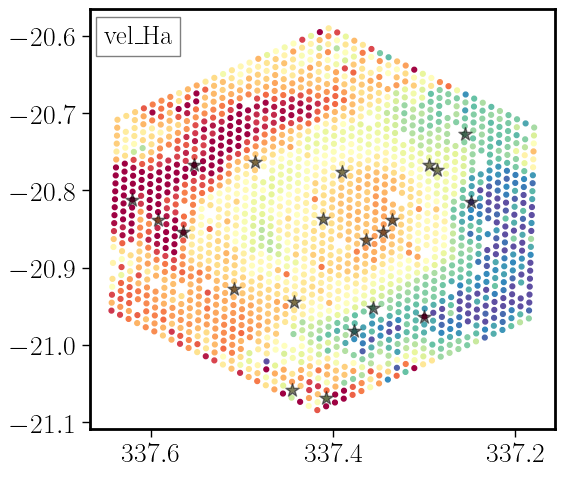

In [80]:
fig, ax = plt.subplots(1,1,figsize=(6,6/1.1))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_pek_6562.85', \
                 vmin=-50, vmax=10, title='vel_Ha', filename=filename,\
             cmap='Spectral', fsize=3.5, figs_dir='figs',gamma=1,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.18,fs=fs,\
                        f_scale=1)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=100,marker='*',c='black',alpha=0.5)


## 16. Hα flux map with stellar-fiber overlay

This plot shows the Hα distribution while marking the fibers selected for the stellar analysis.  
In the Helix paper, Hα traces the overall ionized shell and the bright main ring. The overlay helps show that most stellar candidates are simply superposed on the nebular field.

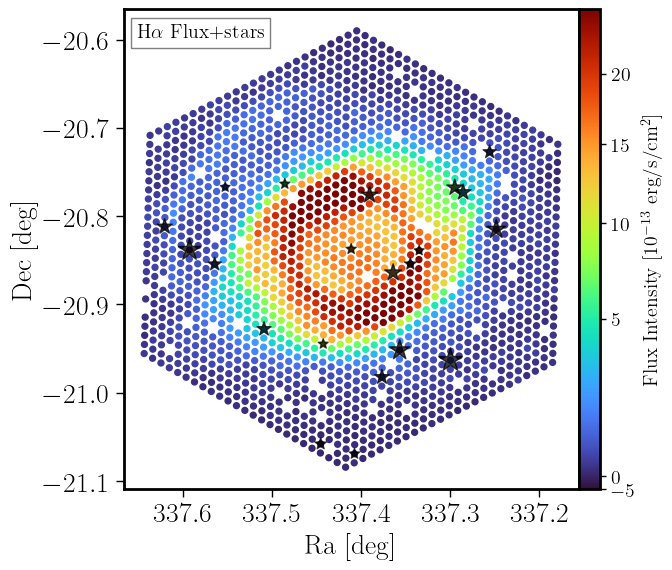

In [81]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

def add_inch_sized_axes(fig, *, width_in, height_in, left_margin_in, bottom_margin_in):
    """
    Exact inch sizing (useful for publication).
    """
    fig_w_in, fig_h_in = fig.get_size_inches()
    w_frac = width_in / fig_w_in
    h_frac = height_in / fig_h_in
    l_frac = left_margin_in / fig_w_in
    b_frac = bottom_margin_in / fig_h_in
    return fig.add_axes([l_frac, b_frac, w_frac, h_frac])

fig = plt.figure(figsize=(7, 6))
ax = fig.add_axes([0.17, 0.15, 0.65, 0.8])  # left, bottom, width, height
#fig, ax = plt.subplots(1,1,figsize=(7,6))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='flux_pek_6562.85', \
                 vmin=-100/f_scale, vmax=24999/f_scale, title=r'H$\alpha$ Flux+stars', filename=filename,\
             cmap='turbo', fsize=5.5, figs_dir='figs',gamma=0.65,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.8,fs=fs*0.75,\
                        f_scale=f_scale)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=2*(tab_DAP_st['SN_st'])*5,marker='*',c='black',\
           edgecolor='black',alpha=0.75)

#xcx= divider.append_axes("right", 0.15, pad=0.05)
cax = fig.add_axes([0.82, 0.15, 0.03, 0.8])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=ax, orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
ax.set_xlabel('Ra [deg]',fontsize=20)
ax.set_ylabel('Dec [deg]',fontsize=20)
#plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/Helix_{DRVER}_stars.pdf', facecolor='white')


This cell identifies the stellar fiber nearest to the nominal nebular center.  
It is useful when selecting a representative example for later RSP/PDF plots.

In [82]:
from astropy.table import Table

# Calculate the Euclidean distance
tab_DAP_st['distance'] = ((tab_DAP_st['ra'] - 337.4)**2 + (tab_DAP_st['dec'] - (-20.85))**2)**0.5

# Find the row with the minimum distance
nearest_row = tab_DAP_st[np.argmin(tab_DAP_st['distance'])]

print(nearest_row)

   id            ra               dec         mask fiberid exposure     MIN_CHISQ             Teff       e_Teff       Log_g        e_Log_g          Fe         e_Fe        alpha        e_alpha        Av_st        e_Av_st           z_st          e_z_st     disp_st      e_disp_st      flux_st             redshift_st          med_flux_st       e_med_flux_st         Teff_MW      e_Teff_MW      Log_g_MW      e_Log_g_MW        Fe_MW        e_Fe_MW       alpha_MW      e_alpha_MW       vel_st            log_ML           log_Mass        flux_HI_3686.83     flux_HI_3691.56   flux_HI_3697.15   flux_HI_3703.85    flux_HI_3711.97   flux_[OII]_3726.03 flux_[OII]_3728.82   flux_HI_3734.37    flux_HI_3750.15  flux_[FeVII]_3758.9  flux_HI_3770.63     flux_HI_3797.9   flux_HeI_3819.61  flux_HI_3835.38   flux_[NeIII]_3868.75  flux_HeI_3888.65  flux_HI_3889.05   flux_CaII_3933.66  flux_HeI_3964.73  flux_[NeIII]_3967.46 flux_CaII_3968.47  flux_Hepsilon_3970.07  flux_HeI_4026.19  flux_[SII]_4068.6 flux_[SII]

## 17. Balmer-ratio diagnostic plot

This scatter plot compares `Hα/Hβ` against `Hβ/Hγ` for fibers with strong Hα.  
It is a compact way to inspect recombination and dust content consistency and possible deviations caused by noise, background issues, or residual calibration problems.

The interpretation should remain cautious, especially in low-S/N fibers or in regions where the line measurements are affected by background residuals.

(2.01, 3.3)

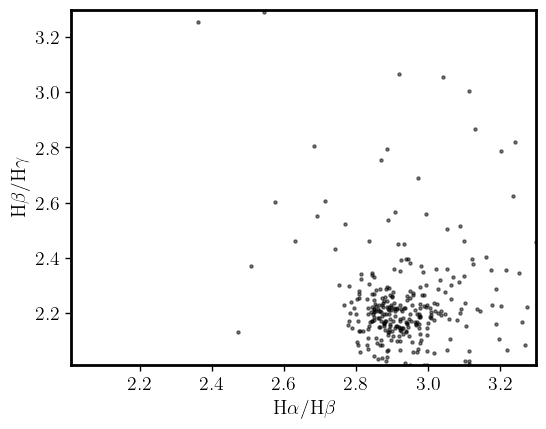

In [83]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pek_6562.85']/tab_DAP['e_flux_pek_6562.85'] > 30
ax.scatter((tab_DAP['flux_Halpha_6562.85']/tab_DAP['flux_Hbeta_4861.36'])[mask_SN_Ha],
           (tab_DAP['flux_Hbeta_4861.36']/tab_DAP['flux_Hgamma_4340.49'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'H$\alpha$/H$\beta$')
ax.set_ylabel(r'H$\beta$/H$\gamma$')
ax.set_xlim(2.01,3.3)
ax.set_ylim(2.01,3.3)
#ax.set_xlabel(r'H$\alpha$/H$\beta$')


## 18. Density-sensitive ratio versus line width

This plot compares the Hα velocity dispersion with the `[S II] 6716/6731` ratio, which is a classical electron-density diagnostic.

The idea is not that a one-to-one relation must exist, but that this plot allows you to explore whether broader lines tend to appear in denser or more complex regions.  
In evolved nebulae like the Helix, the line widths are usually narrow, and the ratio mainly traces density differences across the shell.

(0.0, 2.5)

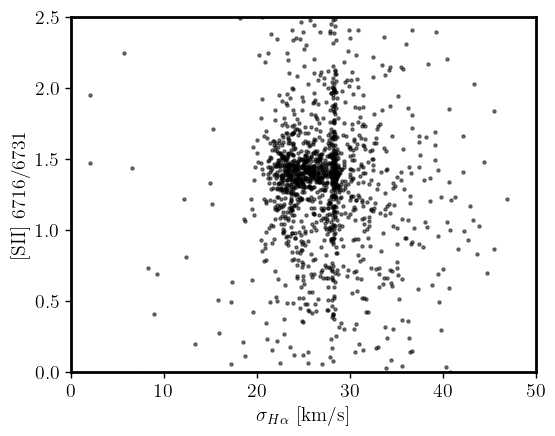

In [84]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           (tab_DAP['flux_[SII]_6716.44']/tab_DAP['flux_[SII]_6730.82'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[SII] 6716/6731')
ax.set_xlim(0,50)
ax.set_ylim(0,2.5)


## 19. [N II]/Hα versus velocity dispersion

This diagnostic links a low-ionization line ratio to the kinematic width of Hα.  
It is useful to identify whether high-dispersion regions are also associated with enhanced low-ionization emission.

For the Helix, elevated `[N II]/Hα` values are expected near the ionization front and in denser outer structures, where [N II] becomes relatively strong compared to Hα.

[WARNING]: /tmp/ipykernel_730594/1376233549.py:5: RuntimeWarning: invalid value encountered in log10
  np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],



(0.0, 50.0)

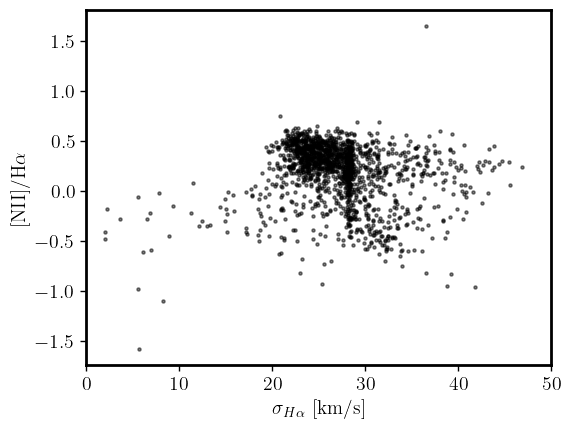

In [85]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[NII]/H$\alpha$')
ax.set_xlim(0,50)
#ax.set_ylim(0,2.5)

## H. Radial structure of the nebula

## 20. Define a radial-profile helper

This function computes radial sums in annuli around a chosen center.  
It is the basis for the next section, where the notebook measures how line fluxes and line ratios change with distance from the central star.

Radial profiles are particularly powerful for the Helix because the nebula is close to circular and its ionization structure is strongly stratified with radius.

In [86]:
def rad_pro(ra_cen, dec_cen, tab_DAP, eline, delta_r, max_r, scale=1):
    ra = tab_DAP['ra']
    dec = tab_DAP['dec']
    r = np.sqrt((ra - ra_cen)**2 + (dec - dec_cen)**2)*scale
    n_r = int(max_r/delta_r)+1
    a_r = np.arange(n_r)*delta_r
    a_flux = np.zeros(n_r)
    a_e_flux = np.zeros(n_r)
    a_n = np.zeros(n_r,dtype=int)
    for I in range(n_r-1):
        if (I==0):
            mask_r = r <= a_r[I+1]
        else:
            mask_r = (r > a_r[I]) & (r <= a_r[I+1])
        a_n[I] = np.sum(mask_r)
        if (a_n[I]>0):
            a_flux[I] = np.nansum(tab_DAP[eline][mask_r])
            a_e_flux[I] = np.sqrt(np.nansum(tab_DAP[eline][mask_r]**2))
        else:
            a_flux[I] = 0
            a_e_flux[I] = 0
    return a_r, a_flux, a_e_flux, a_n

A first test of the radial-profile function using Hα.  
This verifies that the routine works before applying it to the full line set.

In [87]:
a_r, a_flux, a_e_flux, a_n = rad_pro(337.40479, -20.83775, tab_DAP, 'flux_pek_6562.85', 0.5, 25, scale=60)

## 21. Build a reduced table with corrected or selected line products

This cell constructs a smaller table containing:
- the unique fiber identifier,
- sky coordinates,
- and the selected line fluxes and errors.

This is a convenient format for radial-profile work and for background-corrected or custom line analyses.

This is a inheritaged from DR19, as in DR20 we did not need to correct the emission lines from imperfections
in the sky subtraction.

In [90]:
tab_DAP_cor = tab_DAP['id','ra','dec']
for cols in tab_sum_flux['eline']:
    e_cols = 'e_'+cols
    tab_DAP_cor[cols] = tab_DAP[cols]
    tab_DAP_cor[e_cols] = tab_DAP[e_cols]
print(len(tab_DAP_cor.colnames))

113


This cell adds combined doublet fluxes, such as total [O II] and total [S II].  
Those combined quantities are often more physically useful than the individual components when studying overall excitation or when building radial trends.

In [91]:
tab_DAP_add = tab_DAP_cor.copy()


tab_DAP_add['OII'] = tab_DAP_cor['flux_[OII]_3726.03'] + tab_DAP_cor['flux_[OII]_3728.82']
tab_DAP_add['e_OII'] = np.sqrt(tab_DAP_cor['e_flux_[OII]_3726.03']**2 + tab_DAP_cor['e_flux_[OII]_3728.82']**2)
tab_DAP_add['SII'] = tab_DAP_cor['flux_[SII]_6716.44'] + tab_DAP_cor['flux_[SII]_6730.82']
tab_DAP_add['e_SII'] = np.sqrt(tab_DAP_cor['e_flux_[SII]_6716.44']**2 + tab_DAP_cor['e_flux_[SII]_6730.82']**2)



## 22. Radial profiles of absolute line fluxes

This figure reproduces one of the main scientific views of the Helix paper: the azimuthally averaged radial profiles for a representative set of lines.

The expected behavior is:
- a bright main ring around roughly 5–7 arcmin,
- declining flux toward the outer halo,
- high-ionization lines peaking more inward,
- low-ionization lines becoming relatively stronger near the outer ring and ionization front.

[WARNING]: /tmp/ipykernel_730594/2945962901.py:35: RuntimeWarning: divide by zero encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \

[WARNING]: /tmp/ipykernel_730594/2945962901.py:35: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \



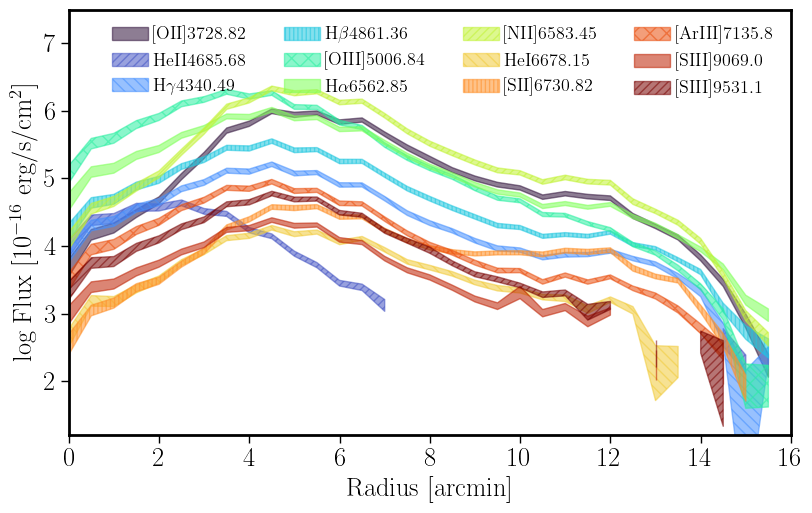

In [98]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']

for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux [10$^{-16}$ erg/s/cm$^2$]')
ax.set_xlim(0,16)
ax.set_ylim(1.21,7.49)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'{DIR_FIG}/rad_flux.pdf', facecolor='white')


## 23. Radial profiles relative to Hβ

This companion figure shows the same lines normalized to Hβ.  
This is especially useful because it suppresses the trivial brightness gradient and highlights changes in ionization conditions.

In the Helix paper, ratios such as `[N II]/Hβ`, `[O II]/Hβ`, and `[S II]/Hβ` rise toward the outer nebula, while high-ionization tracers like `[O III]/Hβ` and He II peak more inward.  
This is the clearest radial signature of classical ionization stratification.

[WARNING]: /tmp/ipykernel_730594/2353875035.py:36: RuntimeWarning: invalid value encountered in divide
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\

[WARNING]: /tmp/ipykernel_730594/2353875035.py:37: RuntimeWarning: invalid value encountered in divide
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \

[WARNING]: /tmp/ipykernel_730594/2353875035.py:36: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\

[WARNING]: /tmp/ipykernel_730594/2353875035.py:37: RuntimeWarning: invalid value encountered in log10
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \



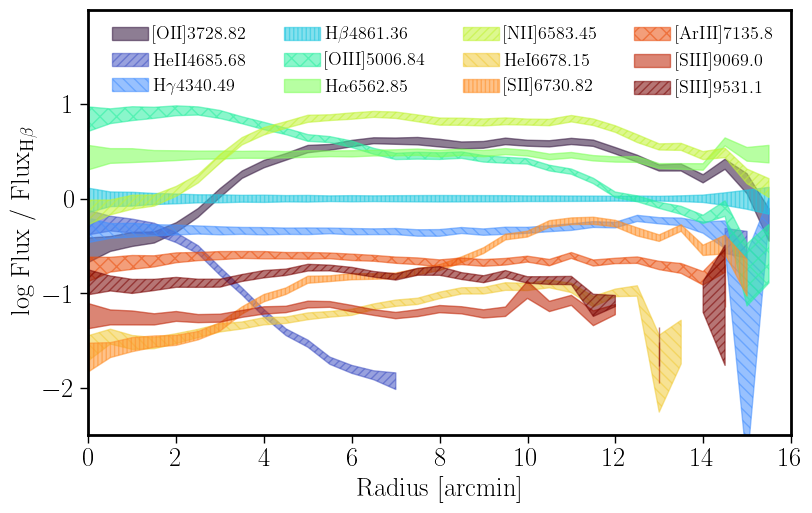

In [99]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']
a_r_hb, a_flux_hb, a_e_flux_hb, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add,\
                                               'flux_Hbeta_4861.36', d_r, r_max, scale=scale)
for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\
                     np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux / Flux$_{\\rm H\\beta}$')
ax.set_xlim(0,16)
ax.set_ylim(-2.49,1.99)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'{DIR_FIG}/rad_rat.pdf', facecolor='white')


## I. RSP libraries and stellar PDF products

## 24. RSP PDF section: focus on the few stellar fibers with high S/N

This section revisits the stellar side of the DAP, now using a stricter cut (`SN_st > 25`).  
In the Helix field, only a handful of fibers satisfy this condition. The paper stresses that these stars are not sufficient for robust conclusions about the nebula, but they are useful to demonstrate how the DAP stellar products are organized.

In [94]:
###############################################
# RSP PDF plots

#
# Stars with SN>25
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 25
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]


## 25. Load the compact RSP library

This file contains the reduced RSP basis used by the DAP.  
Inspecting its HDU structure is useful before plotting the probability-distribution maps stored in it.

We download the RSP templates if they are not in the cache already

In [100]:
#####################################################
# Download required RSP templates if not present in cache
#####################################################
def ensure_files_from_links(dir_cache, file_links):
    dir_cache = Path(dir_cache)
    dir_cache.mkdir(parents=True, exist_ok=True)

    for fname, url in file_links.items():
        out = dir_cache / fname

        if out.exists():
            print(f"Found: {fname}")
            continue

        print(f"Downloading: {fname}")
        gdown.download(url=url, output=str(out), quiet=False)

        if out.exists():
            print(f"OK: {fname}")
        else:
            print(f"FAILED: {fname}")


# Example usage
FOLDER_URL = "https://drive.google.com/drive/folders/1LklOobJpTsgtTlBCswkXNuhmc856XAA4?usp=drive_link"


file_links = {
        "mstar-stlib-cl-108.fits.gz": "https://drive.google.com/uc?id=1RZkdshRNVi69TbVmow5sNdI2kAQokbWO",
        "mstar-stlib-n1235-SN5.fits.gz": "https://drive.google.com/uc?id=1e4vOLBBOSa6n69E4g3a3HMOhZyOPCs3f"
              }  

ensure_files_from_links(DIR_CACHE, file_links)


Found: mstar-stlib-cl-108.fits.gz
Found: mstar-stlib-n1235-SN5.fits.gz


## Content of the RSP template file

The RSP (Resolved Stellar Population) template file contains the stellar spectral library used by the LVM-DAP to model the stellar continuum. Unlike classical SSP-based libraries, these templates are constructed from combinations of observed stellar spectra, and each template is associated with a **probability distribution function (PDF)** of physical parameters rather than a single set of values. :contentReference[oaicite:0]{index=0}

The file is organized in multiple FITS extensions:

- **SPECTRA (HDU 0)**:  
  Row-stacked spectra (RSS) of the RSP templates, with dimensions *(Nwave, Ntemplate)*. Each column corresponds to one template spectrum, constructed by clustering and averaging stellar spectra in observational space.

- **PARAMETERS (HDU 1)**:  
  Table containing the **luminosity-weighted average stellar parameters** associated with each template (e.g., effective temperature, surface gravity, metallicity, and α-enhancement), derived from the underlying stellar sample.

- **ERROR (HDU 2)**:  
  Uncertainty associated with each template spectrum, propagated from the dispersion of the original stellar spectra used to construct each RSP.

- **ORG_PARAM (HDU 3)**:  
  Parameters of the original stellar library elements used to build the templates. This extension preserves the link between the final RSPs and the initial stellar population sampling.

- **PDF extensions (HDU 4–9)**:  
  These are 3D cubes containing projections of the **probability distribution functions (PDFs)** of stellar parameters for each template:
  - `PDF_TEFF_LOGG`: Teff vs log(g)
  - `PDF_TEFF_MET`: Teff vs [Fe/H]
  - `PDF_TEFF_ALPHAM`: Teff vs [α/Fe]
  - `PDF_MET_ALPHAM`: [Fe/H] vs [α/Fe]
  - `PDF_MET_LOGG`: [Fe/H] vs log(g)
  - `PDF_LOGG_MET`: log(g) vs [Fe/H]

  Each slice along the third axis corresponds to one template. These PDFs encode the intrinsic degeneracies and uncertainties of the stellar population represented by each RSP.

This structure allows the DAP to:
- model the stellar continuum using a **linear combination of templates**,  
- propagate uncertainties and degeneracies through the PDFs,  
- and derive physically meaningful stellar parameters even in regimes where only a few stars (or even a single star) are sampled within a fiber. :contentReference[oaicite:1]{index=1}

In practice, the final stellar properties for a given spectrum are obtained by combining the PDFs of the templates weighted by their fitted coefficients, rather than assigning a single best-fit value per template.

In [104]:
#################################################
# This is the RSP file used in the DAP for the stellar templates, which is required to convert the fluxes to physical units
#################################################
rsp_file=f'{DIR_CACHE}/mstar-stlib-cl-108.fits.gz'
rsp_hdu=fits.open(rsp_file)
rsp_hdu.info()

Filename: cache//mstar-stlib-cl-108.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SPECTRA       1 PrimaryHDU      13   (6351, 108)   float32   
  1  PARAMETERS    1 BinTableHDU     29   108R x 10C   [D, E, E, E, E, E, E, E, E, E]   
  2  ERROR         1 ImageHDU        14   (6351, 108)   float32   
  3  ORG_PARAM     1 BinTableHDU     31   1235R x 11C   [K, E, E, E, E, E, E, E, E, E, J]   
  4  PDF_TEFF_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  5  PDF_TEFF_MET    1 ImageHDU        17   (100, 100, 108)   float64   
  6  PDF_TEFF_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  7  PDF_MET_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  8  PDF_MET_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  9  PDF_LOGG_MET    1 ImageHDU        17   (100, 100, 108)   float64   


This cell opens the full MaStar-based stellar library summary used for comparison.  
The goal is to compare the recovered stellar PDFs for the selected fibers with the overall distribution of the template library.

In [105]:
in_file=f'{DIR_CACHE}/mstar-stlib-n1235-SN5.fits.gz'
hdu_in=fits.open(in_file)
tab_in=Table(hdu_in[1].data)
tab_in.columns


<TableColumns names=('N_ST','TEFF','LOGG','MET','ALPHAM','FNORM','e_TEFF','e_LOGG','e_MET','e_ALPHAM')>

## 26. Convert the per-fiber RSP columns into a long-format coefficient table

The DAP stores the RSP results in a wide format, with many columns carrying the RSP identifier in the column name.  
This helper function inverts that structure into a long table with one row per `(fiber, rsp)` pair, making it much easier to inspect:
- coefficients (i.e., the light contribution of each RSP template to the stellar continuum),
- template stellar parameters (Teff, log(g), [Fe/H], [alpha/Fe])

In [108]:
from astropy.table import Table, vstack

def invert_transformation(tab_C_ord):
    # Extract unique RSP IDs from column names
    rsp_ids = [col.split('_')[-1] for col in tab_C_ord.colnames if col.startswith('Teff_rsp_')]
    rsp_ids = list(set(rsp_ids))  # Get unique RSP IDs

    # Initialize an empty list to store individual tables
    tables = []

    for I,rsp_id in enumerate(rsp_ids):
        # Extract columns for the current RSP ID
        cols_to_extract = ['id'] + [col for col in tab_C_ord.colnames if col.endswith(f'_{rsp_id}')]
        tab_tmp = tab_C_ord[cols_to_extract]

        # Rename columns to remove the RSP ID suffix
        for col in tab_tmp.colnames:
            if col != 'id':
                tab_tmp.rename_column(col, col.replace(f'_{rsp_id}', ''))

        # Add the RSP ID as a column
        tab_tmp['id_rsp'] = rsp_id
        #tab_tmp['id_fib'] = I
        # Append the table to the list
        tables.append(tab_tmp)

        # Combine all tables into a single table
    tab_COEFFS = vstack(tables)    
    tab_COEFFS['id_fib'] = [int(rsp.split(".")[1]) for rsp in tab_COEFFS['id']]
    tab_COEFFS['id_rsp'] = tab_COEFFS['id_rsp'].astype(int)
    tab_COEFFS.rename_column('id_rsp', 'rsp')
    tab_COEFFS.rename_column('Teff_rsp', 'TEFF')
    tab_COEFFS.rename_column('Log_g_rsp', 'LOGG')
    tab_COEFFS.rename_column('Fe_rsp', 'META')
    tab_COEFFS.rename_column('alpha_rsp', 'ALPHAM')
    tab_COEFFS.rename_column('W_rsp', 'COEFF')
    tab_COEFFS.rename_column('min_W_rsp', 'Min.Coeff')
    tab_COEFFS.rename_column('log_ML_rsp', 'log(M/L)')
    tab_COEFFS.rename_column('Av_rsp', 'AV')
    tab_COEFFS.rename_column('n_W_rsp', 'N.Coeff')
    tab_COEFFS.rename_column('e_W_rsp', 'Err.Coeff')


    tab_COEFFS.sort('rsp', reverse=False)
    return tab_COEFFS



This applies the transformation to the selected stellar subset, creating the `tab_coeffs` table used in the PDF plots.

In [111]:
tab_coeffs = invert_transformation(tab_DAP_st)

A simple inspection checkpoint for the coefficient table.

## 27. Helper functions for RSP PDF plots

These functions:
- derive contour levels from the template-density maps,
- and overlay the weighted PDF implied by one selected fiber.

This section is the notebook counterpart to the stellar-PDF figure in the Helix paper, where the recovered stellar properties are compared with the full distribution of the template library.

In [112]:



def get_den_levels(den_map=None,conts=[0.99,0.65,0.40,0.0]):    
    vals=[]
    levels=[]
    den_map_p = den_map/np.max(den_map)
    for idx,cuts in enumerate(np.arange(0.00,1.0,0.01)):
        mask_now= den_map_p>cuts
        levels.append(cuts)
        vals.append(den_map_p[mask_now].sum()/den_map_p.sum())
    vals_cont=np.array(conts)
    levels_cont=np.interp(vals_cont,np.array(levels),np.array(vals))
    return levels_cont,den_map_p


def PDF_plot(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato',\
             pXhist = False, pYhist = False):
    (nz,ny,nx)=hdu_now.data.shape

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+(nx)*hdu_now.header['CDELT1'])#
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+(ny)*hdu_now.header['CDELT2'])

    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)

    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)

    levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
    p_cont_few=ax.contour(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent)
    p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent,alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])


    xhist = den_map_few.sum(axis=0)
    yhist = den_map_few.sum(axis=1)
    divider = make_axes_locatable(ax)
    if (pXhist):
        axLSX = divider.append_axes("top", 0.35, pad=0.0, sharex=ax)
        axLSX.plot(np.linspace(xLims[0], xLims[1], len(xhist)), xhist, color=color_PDF)
        axLSX.axis('off')  # Remove the labels and the borders of the axis           
        axLSX.set_xlim(ax.get_xlim())
        axLSX.tick_params(labelbottom=False)
        axLSX.set_ylim(0.001*np.max(xhist),1.01*np.max(xhist))
    if (pYhist):
        axLSY = divider.append_axes("right", 0.35, pad=0.0, sharey=ax)
        axLSY.plot(yhist,np.linspace(yLims[0],yLims[1],len(yhist)),color=color_PDF)
        axLSY.set_ylim(ax.get_ylim())  
        axLSY.axis('off') 
        axLSY.set_xlim(0.001*np.max(yhist),1.01*np.max(yhist))
    return den_map,den_map_few


def PDF_get(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato'):
    (nz,ny,nx)=hdu_now.data.shape


    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)
    return den_map_few



def PDF_plot_cl(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fibs=None,\
             conts=[0.99,0.65,0.40,0.0],cmap='Spectral',c_cut=0.8):
    (nz,ny,nx)=hdu_now.data.shape
 
    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    

    den_map=np.average(hdu_now.data,axis=0)

    
    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)


    cmap_class = mpl.colormaps[cmap]
    colors = cmap_class(np.linspace(0, c_cut, len(n_fibs)))
    for I,n_fib in enumerate(n_fibs):
        den_map_few=hdu_now.data[n_fib,:,:]
        levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
        p_cont_few=ax.contour(den_map_p,levels_cont, colors=colors[I],origin='lower', extent=extent, label=f'\#{n_fib}')
        color_now = mpl.colors.to_hex(colors[I], keep_alpha=True)
        p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_now,origin='lower', extent=extent, alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

This prints the available fiber IDs in the transformed coefficient table, helping select example fibers for the PDF plots.

This is a first test of the PDF plotting function for one projection of the parameter space.  
It is useful for checking axis ranges, contour levels, and consistency between the recovered coefficients and the template library.

It shows the general PDF distribution for the full MaStar catalog compared with the PDF for fiber 519

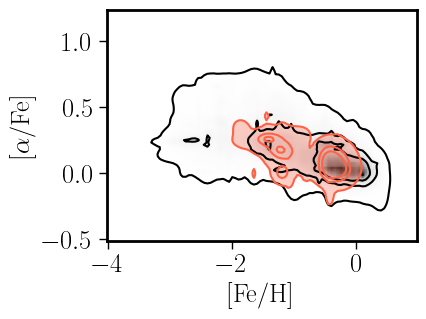

In [113]:
hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'

hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'
n_fib = 519



fig, ax = plt.subplots(figsize=(4,3))  
out = PDF_plot(ax=ax,hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=[0.85,0.40,0.0])  


## 28. Multi-panel stellar PDF figure for one fiber

This figure is one of the closest notebook analogs to the stellar-PDF plot discussed in the Helix paper.  
It shows how the coefficients for one selected fiber project onto different parameter planes:
- `Teff` vs `log g`
- `Teff` vs `[α/Fe]`
- `[Fe/H]` vs `[α/Fe]`
- `[Fe/H]` vs `log g`

The overplotted star marks the luminosity-weighted values derived by the DAP.  
The main lesson for the Helix is again caution: the DAP can produce these stellar products, but the stellar signal in this field is too limited for strong astrophysical conclusions.

0.15 0.15
0.15 0.45
0.45 0.15
0.45 0.45


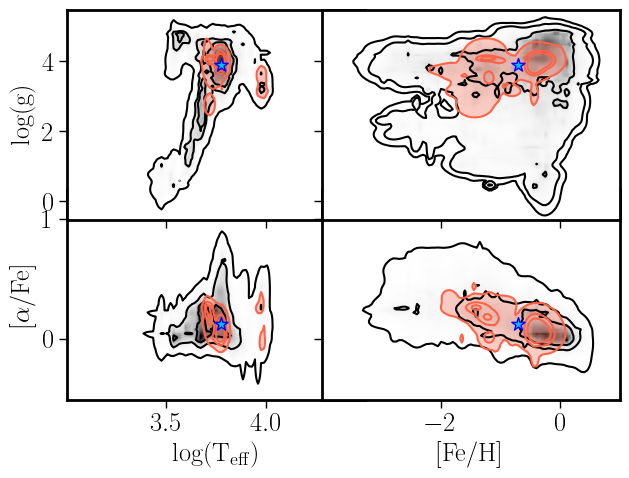

In [114]:
# You can change the n_fib value to plot the PDF for different fibers. Here are some examples:
# n_fib=49
# n_fib=1808
# n_fib=224
# n_fib=1808


fig=plt.figure(figsize=(8.5,6))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]



hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100

mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


plt.show()


## 29. Build an average coefficient representation

This cell groups the coefficients by RSP and computes a mean table.  
It is effectively a way to build an average PDF representation across the selected sample.

In [115]:
from astropy.table import Table, vstack

# Group by 'rsp' and calculate the mean for each group
grouped_data = {}
for col in tab_coeffs.colnames:
    if col in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
        grouped_data[col] = []
    else:
        grouped_data[col] = []

unique_rsp = set(tab_coeffs['rsp'])
for rsp_value in unique_rsp:
    mask = tab_coeffs['rsp'] == rsp_value
    grouped_data['rsp'].append(rsp_value)
    for col in tab_coeffs.colnames:
        if col not in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
            grouped_data[col].append(tab_coeffs[col][mask].mean())
        elif col == 'id':  # For 'id', concatenate unique values as strings
            grouped_data[col].append(','.join(tab_coeffs[col][mask]))

# Create a new table with the averaged data
output_table = Table(grouped_data)
output_table['id'] = 1
output_table['id_fib'] = 1


This resets the plotting style for the final publication-quality stellar PDF panel.

In [116]:
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

## 30. Publication-style combined PDF panel

This is the polished version of the stellar PDF visualization, arranged as a four-panel figure with consistent limits, overlaid summary values, and contours from the template library.

It mirrors the style of the stellar-PDF figure in the Helix paper, while remaining fully based on the notebook products.

[WARNING]: /tmp/ipykernel_730594/1410890298.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()



0.15 0.15
0.15 0.45
0.45 0.15
0.45 0.45


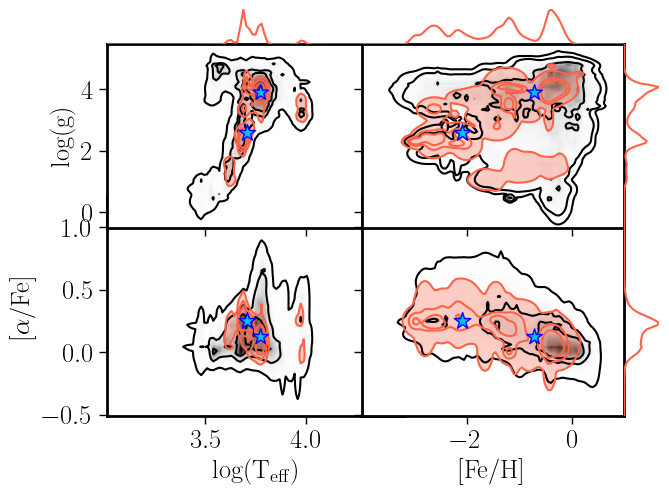

In [117]:
# We select a different fiber to plot the PDF, which is the one with the closest match to the DAP values. You can change the n_fib value to plot the PDF for different fibers. Here are some examples:
# n_fib=49
# n_fib=1808
n_fib=1
#n_fib=1808





fig=plt.figure(figsize=(8.5,6.25))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]





hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
den_map,den_map_few = PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts, pXhist=True)  


hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pYhist=True)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pXhist=True,pYhist=True)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100
size = (tab_DAP_st['SN_st'])*5
mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'],tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


#axLS[0].scatter(tab_in['TEFF'],tab_in['ALPHAM'],color='green',s=5)

#axLS[1].scatter(tab_in['TEFF'],tab_in['LOGG'],color='green')
#print(tab_in['TEFF'][n_fib],tab_in['LOGG'][n_fib])
figname=f'PDF_rsp_Helix_SN25'
fig.tight_layout()
fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")